In [ ]:
import numpy as np
import xarray as xr
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cf
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
# import colorcet as cc
import copy, os
import colormaps as cmaps
import easygems.healpix as egh

In [ ]:
rootdir = '/pscratch/sd/w/wcmca1/hackathon/cof_masks/stats/monthly/'
name_map = {
    'obs': 'IMERGv7',
    'm1': 'scream',
    'm2': 'icon_d3hp003',
    'm3': 'nicam_gl11',
    'm4': 'um_glm_n2560_RAL3p3',
    'm5': 'casesm2_10km_nocumulus',
}
name_map_plot = {
    'obs': 'OBS',
    'm1': 'SCREAM',
    'm2': 'ICON',
    'm3': 'NICAM',
    'm4': 'UM',
    'm5': 'CASESM2',
}

# Input filenames
filenames = {key:f'{rootdir}{value}_monthly_rainmap_cof_hp8_v1.nc' for key,value in name_map.items()}

landmaskfile = '/global/cfs/cdirs/m4581/gsharing/hackathon/scream-cess-healpix/scream2D_hrly_topo_hp8_v7.zarr'

figdir = '/global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/'
os.makedirs(figdir, exist_ok=True)
print(figdir)

### Check if input files exist

In [ ]:
for key, value in filenames.items():
    print(f'{value}: {os.path.isfile(value)}')

In [ ]:
dstop = xr.open_dataset(landmaskfile)
ter = dstop.ELEV
landfrac = dstop.LANDFRAC
dstop

In [ ]:
im = egh.healpix_show(ter, cmap='terrain')
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Elevation (m)')

In [ ]:
im = egh.healpix_show(landfrac, cmap='Greens', vmin=0, vmax=1)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Land Fraction')

## Read and combine all sources to a single DataSet

In [ ]:
drop_vars = []
# Read all files and combine them with a new dimension 'source'
ds = xr.open_mfdataset(list(filenames.values()), combine='nested', concat_dim='source', drop_variables=drop_vars).squeeze()
# Assign new coordinate 'source' using name_map dictionary keys
ds['source'] = list(name_map.keys())
# ds = ds.pipe(egh.attach_coords)
# Load lat/lon coordinates in memory
hp_lat = ds.lat.load()
hp_lon = ds.lon.load()
ds

In [ ]:
ds.ntimes.sum(dim='time').values

In [ ]:
# Get time interval from attributes
time_interval = float(ds.attrs['time_interval'])

# Calculate total hours accounting for time interval
# ntimes is the number of timesteps, multiply by time_interval to get actual hours
ntimes = ds.ntimes.sum(dim='time')
nhours = ntimes * time_interval

# Sum monthly precipitation amount [mm], divided by total hours to get mm/day
tot_pcp_all = (24. * ds.precipitation.sum(dim='time') / nhours).compute()

# Original features
mcs_pcp_all = (24. * ds.mcs_precipitation.sum(dim='time') / nhours).compute()
ar_pcp_all = (24. * ds.ar_precipitation.sum(dim='time') / nhours).compute()
etc_pcp_all = (24. * ds.etc_precipitation.sum(dim='time') / nhours).compute()
tc_pcp_all = (24. * ds.tc_precipitation.sum(dim='time') / nhours).compute()

# Isolated features only
mcs_iso_pcp_all = (24. * ds.mcs_iso_precipitation.sum(dim='time') / nhours).compute()
ar_iso_pcp_all = (24. * ds.ar_iso_precipitation.sum(dim='time') / nhours).compute()
etc_iso_pcp_all = (24. * ds.etc_iso_precipitation.sum(dim='time') / nhours).compute()
# Co-occurrence features
mcs_ar_pcp_all = (24. * ds.mcs_ar_precipitation.sum(dim='time') / nhours).compute()
mcs_etc_pcp_all = (24. * ds.mcs_etc_precipitation.sum(dim='time') / nhours).compute()
ar_etc_pcp_all = (24. * ds.ar_etc_precipitation.sum(dim='time') / nhours).compute()
mcs_ar_etc_pcp_all = (24. * ds.mcs_ar_etc_precipitation.sum(dim='time') / nhours).compute()
# Cloud types (not tracked)
dc_pcp_all = (24. * ds.dc_precipitation.sum(dim='time') / nhours).compute()
nd_pcp_all = (24. * ds.nd_precipitation.sum(dim='time') / nhours).compute()
st_pcp_all = (24. * ds.st_precipitation.sum(dim='time') / nhours).compute()
dz_pcp_all = (24. * ds.dz_precipitation.sum(dim='time') / nhours).compute()

# Calculate precipitation fractions
# Original features
mcs_pcpfrac_all = 100. * mcs_pcp_all / tot_pcp_all
tc_pcpfrac_all = 100. * tc_pcp_all / tot_pcp_all

# Isolated features only
mcs_iso_pcpfrac_all = 100. * mcs_iso_pcp_all / tot_pcp_all
ar_iso_pcpfrac_all = 100. * ar_iso_pcp_all / tot_pcp_all
tc_pcpfrac_all = 100. * tc_pcp_all / tot_pcp_all
etc_iso_pcpfrac_all = 100. * etc_iso_pcp_all / tot_pcp_all
# Co-occurrence features
mcs_ar_pcpfrac_all = 100. * mcs_ar_pcp_all / tot_pcp_all
mcs_etc_pcpfrac_all = 100. * mcs_etc_pcp_all / tot_pcp_all
ar_etc_pcpfrac_all = 100. * ar_etc_pcp_all / tot_pcp_all
mcs_ar_etc_pcpfrac_all = 100. * mcs_ar_etc_pcp_all / tot_pcp_all
# Cloud types (not tracked)
dc_pcpfrac_all = 100. * dc_pcp_all / tot_pcp_all
nd_pcpfrac_all = 100. * nd_pcp_all / tot_pcp_all
st_pcpfrac_all = 100. * st_pcp_all / tot_pcp_all
dz_pcpfrac_all = 100. * dz_pcp_all / tot_pcp_all

In [ ]:
nhours.sel(source='m1').values

In [ ]:
# Calculate number of feature mask hours
# Original features
mcs_count_all = ds.mcs_count.sum(dim='time').compute()
ar_count_all = ds.ar_count.sum(dim='time').compute()
etc_count_all = ds.etc_count.sum(dim='time').compute()
tc_count_all = ds.tc_count.sum(dim='time').compute()

# Isolated features only
mcs_iso_count_all = ds.mcs_iso_count.sum(dim='time').compute()
ar_iso_count_all = ds.ar_iso_count.sum(dim='time').compute()
etc_iso_count_all = ds.etc_iso_count.sum(dim='time').compute()
# Co-occurrence features
mcs_ar_count_all = ds.mcs_ar_count.sum(dim='time').compute()
mcs_etc_count_all = ds.mcs_etc_count.sum(dim='time').compute()
ar_etc_count_all = ds.ar_etc_count.sum(dim='time').compute()
mcs_ar_etc_count_all = ds.mcs_ar_etc_count.sum(dim='time').compute()
# Cloud types (not tracked)
dc_count_all = ds.dc_count.sum(dim='time').compute()
nd_count_all = ds.nd_count.sum(dim='time').compute()
st_count_all = ds.st_count.sum(dim='time').compute()
dz_count_all = ds.dz_count.sum(dim='time').compute()

# Calculate feature mask frequencies (as percentages)
# Original features
mcs_freq_all = 100. * mcs_count_all / nhours
ar_freq_all = 100. * ar_count_all / nhours
etc_freq_all = 100. * etc_count_all / nhours
tc_freq_all = 100. * tc_count_all / nhours

# Isolated features only
mcs_iso_freq_all = 100. * mcs_iso_count_all / nhours
ar_iso_freq_all = 100. * ar_iso_count_all / nhours
etc_iso_freq_all = 100. * etc_iso_count_all / nhours
# Co-occurrence features
mcs_ar_freq_all = 100. * mcs_ar_count_all / nhours
mcs_etc_freq_all = 100. * mcs_etc_count_all / nhours
ar_etc_freq_all = 100. * ar_etc_count_all / nhours
mcs_ar_etc_freq_all = 100. * mcs_ar_etc_count_all / nhours
# Cloud types (not tracked)
dc_freq_all = 100. * dc_count_all / nhours
nd_freq_all = 100. * nd_count_all / nhours
st_freq_all = 100. * st_count_all / nhours
dz_freq_all = 100. * dz_count_all / nhours

In [ ]:
# im = egh.healpix_show(ar_freq_all.sel(source='obs'), cmap=cmaps.cet_l_wyor)
im2 = egh.healpix_show(etc_freq_all.sel(source='obs'), vmin=2, vmax=10, cmap=cmaps.cet_l_bgy)
plt.colorbar(im2, orientation='horizontal', pad=0.05, label='ETC Frequency (%)')

In [ ]:
src = 'm1'
im = egh.healpix_show(ar_freq_all.sel(source=src), vmin=0, vmax=3, cmap=cmaps.cet_l_wyor)
im2 = egh.healpix_contour(etc_freq_all.sel(source=src), levels=np.arange(2, 10.1, 2), cmap=cmaps.cet_l_bgy, linewidths=1)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='AR Frequency (%)')

In [ ]:
# Number of feature precipitation hours
# Original features
mcs_pcpcount_all = ds.mcs_precipitation_count.sum(dim='time').compute()
ar_pcpcount_all = ds.ar_precipitation_count.sum(dim='time').compute()
etc_pcpcount_all = ds.etc_precipitation_count.sum(dim='time').compute()
tc_pcpcount_all = ds.tc_precipitation_count.sum(dim='time').compute()

# Isolated features only
mcs_iso_pcpcount_all = ds.mcs_precipitation_count.sum(dim='time').compute()
ar_iso_pcpcount_all = ds.ar_precipitation_count.sum(dim='time').compute()
etc_iso_pcpcount_all = ds.etc_precipitation_count.sum(dim='time').compute()
# Co-occurrence features
mcs_ar_pcpcount_all = ds.mcs_ar_precipitation_count.sum(dim='time').compute()
mcs_etc_pcpcount_all = ds.mcs_etc_precipitation_count.sum(dim='time').compute()
ar_etc_pcpcount_all = ds.ar_etc_precipitation_count.sum(dim='time').compute()
mcs_ar_etc_pcpcount_all = ds.mcs_ar_etc_precipitation_count.sum(dim='time').compute()

# Calculate feature frequencies (as percentages)
# Original features
mcs_pcpfreq_all = 100 * mcs_pcpcount_all / ntimes
ar_pcpfreq_all = 100 * ar_pcpcount_all / ntimes
etc_pcpfreq_all = 100 * etc_pcpcount_all / ntimes
tc_pcpfreq_all = 100 * tc_pcpcount_all / ntimes

# Isolated features only
mcs_iso_pcpfreq_all = 100 * mcs_iso_pcpcount_all / ntimes
ar_iso_pcpfreq_all = 100 * ar_iso_pcpcount_all / ntimes
etc_iso_pcpfreq_all = 100 * etc_iso_pcpcount_all / ntimes
# Co-occurrence features
mcs_ar_pcpfreq_all = 100 * mcs_ar_pcpcount_all / ntimes
mcs_etc_pcpfreq_all = 100 * mcs_etc_pcpcount_all / ntimes
ar_etc_pcpfreq_all = 100 * ar_etc_pcpcount_all / ntimes
mcs_ar_etc_pcpfreq_all = 100 * mcs_ar_etc_pcpcount_all / ntimes

In [ ]:
im = egh.healpix_show(mcs_freq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='All MCS Frequency (%)')

In [ ]:
im = egh.healpix_show(mcs_iso_freq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Isolated MCS Frequency (%)')

In [ ]:
im = egh.healpix_show(mcs_iso_freq_all.sel(source='m1'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Isolated MCS Frequency (%)')

In [ ]:
im = egh.healpix_show(mcs_iso_pcpfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Isolated MCS Precipitation Frequency (%)')

In [ ]:
im = egh.healpix_show(mcs_ar_pcpfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR Precipitation Frequency (%)')

In [ ]:
im = egh.healpix_show(mcs_ar_etc_pcpfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR-ETC Precipitation Frequency (%)')

In [ ]:
im = egh.healpix_show(mcs_pcp_all.sel(source='obs'), vmin=0, vmax=8, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='All MCS Precipitation (mm/day)')

In [ ]:
im = egh.healpix_show(mcs_iso_pcp_all.sel(source='obs'), vmin=0, vmax=8, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Isolated MCS Precipitation (mm/day)')

In [ ]:
im = egh.healpix_show(mcs_ar_pcp_all.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR Precipitation (mm/day)')

In [ ]:
im = egh.healpix_show(mcs_ar_etc_pcp_all.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR-ETC Precipitation (mm/day)')

In [ ]:
im = egh.healpix_show(dc_pcp_all.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Deep Convection Precipitation (mm/day)')

## Filter data by latitude bands

In [ ]:
tropics_lat = [-20, 20]
# extratropics_lat = [-90, -20, 20, 90]
tc_lat = [-40, 40]

tot_pcp_all_trop = tot_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
tot_pcp_all_extrop = tot_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

# Filter features for different latitude bands
# Original features
mcs_freq_all_trop = mcs_freq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_freq_all_extrop = mcs_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_pcp_all_trop = mcs_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_pcp_all_extrop = mcs_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

tc_freq_all_trop = tc_freq_all.where((hp_lat >= min(tc_lat)) & (hp_lat <= max(tc_lat)))
tc_pcp_all_trop = tc_pcp_all.where((hp_lat >= min(tc_lat)) & (hp_lat <= max(tc_lat)))

# Isolated features only
mcs_iso_freq_all_trop = mcs_iso_freq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_iso_pcp_all_trop = mcs_iso_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_iso_pcp_all_extrop = mcs_iso_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

ar_iso_freq_all_extrop = ar_iso_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
ar_iso_pcp_all_extrop = ar_iso_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

etc_iso_freq_all_extrop = etc_iso_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
etc_iso_pcp_all_extrop = etc_iso_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

# Cloud types (not tracked)
dc_freq_all_trop = dc_freq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
dc_pcp_all_trop = dc_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
dc_freq_all_extrop = dc_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
dc_pcp_all_extrop = dc_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

nd_freq_all_trop = nd_freq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
nd_pcp_all_trop = nd_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
nd_freq_all_extrop = nd_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
nd_pcp_all_extrop = nd_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

st_freq_all_trop = st_freq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
st_pcp_all_trop = st_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
st_freq_all_extrop = st_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
st_pcp_all_extrop = st_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

dz_freq_all_trop = dz_freq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
dz_pcp_all_trop = dz_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
dz_freq_all_extrop = dz_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
dz_pcp_all_extrop = dz_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

# Co-occurrence features
mcs_ar_freq_all_extrop = mcs_ar_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_ar_pcp_all_extrop = mcs_ar_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_ar_pcpfrac_all_extrop = mcs_ar_pcpfrac_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

mcs_etc_freq_all_extrop = mcs_etc_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_etc_pcp_all_extrop = mcs_etc_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_etc_pcpfrac_all_extrop = mcs_etc_pcpfrac_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

ar_etc_freq_all_extrop = ar_etc_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
ar_etc_pcp_all_extrop = ar_etc_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
ar_etc_pcpfrac_all_extrop = ar_etc_pcpfrac_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

mcs_ar_etc_freq_all_extrop = mcs_ar_etc_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_ar_etc_pcp_all_extrop = mcs_ar_etc_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_ar_etc_pcpfrac_all_extrop = mcs_ar_etc_pcpfrac_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

In [ ]:
# im = egh.healpix_show(tot_pcp_all_trop.sel(source='obs'), vmin=0, vmax=12, cmap=cmaps.WhBlGrYeRe)
im = egh.healpix_show(tot_pcp_all_extrop.sel(source='obs'), vmin=0, vmax=8, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Total Precipitation (mm/day)')

In [ ]:
im = egh.healpix_show(mcs_ar_pcp_all_extrop.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR Precipitation (mm/day)')

In [ ]:
im = egh.healpix_show(mcs_ar_etc_pcp_all_extrop.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR-ETC Precipitation (mm/day)')

In [ ]:
im = egh.healpix_show(dc_pcp_all_trop.sel(source='m4'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='DC Tropics Precipitation (mm/day)')

In [ ]:
colormaps = cmaps.WhiteBlueGreenYellowRed
levels = np.arange(0, 40.1, 5)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(dc_pcpfrac_all.sel(source='obs'), cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='DC Precipitation Fraction (%)')

In [ ]:
colormaps = cmaps.WhiteBlueGreenYellowRed
levels = np.arange(0, 40.1, 5)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(st_pcpfrac_all.sel(source='obs'), cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='DC Precipitation Fraction (%)')

In [ ]:
colormaps = cmaps.WhiteBlueGreenYellowRed
levels = np.arange(0, 40.1, 5)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(nd_pcpfrac_all.sel(source='obs'), cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='ND Precipitation Fraction (%)')

In [ ]:
colormaps = cmaps.WhiteBlueGreenYellowRed
levels = np.arange(0, 40.1, 5)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(dz_pcpfrac_all.sel(source='obs'), cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='DZ Precipitation Fraction (%)')

In [ ]:
# Compute global mean values
# Original features
mcs_freq_all_avg = mcs_freq_all.mean(dim='cell').compute()
mcs_freq_all_trop_avg = mcs_freq_all_trop.mean(dim='cell').compute()
mcs_freq_all_extrop_avg = mcs_freq_all_extrop.mean(dim='cell').compute()

mcs_pcp_all_avg = mcs_pcp_all.mean(dim='cell').compute()
mcs_pcp_all_trop_avg = mcs_pcp_all_trop.mean(dim='cell').compute()
mcs_pcp_all_extrop_avg = mcs_pcp_all_extrop.mean(dim='cell').compute()

tc_freq_all_trop_avg = tc_freq_all_trop.mean(dim='cell').compute()
tc_pcp_all_trop_avg = tc_pcp_all_trop.mean(dim='cell').compute()

# Isolated features only
mcs_iso_freq_all_trop_avg = mcs_iso_freq_all_trop.mean(dim='cell').compute()
mcs_iso_pcp_all_trop_avg = mcs_iso_pcp_all_trop.mean(dim='cell').compute()
mcs_iso_pcp_all_extrop_avg = mcs_iso_pcp_all_extrop.mean(dim='cell').compute()

ar_iso_freq_all_extrop_avg = ar_iso_freq_all_extrop.mean(dim='cell').compute()
ar_iso_pcp_all_extrop_avg = ar_iso_pcp_all_extrop.mean(dim='cell').compute()

etc_iso_freq_all_extrop_avg = etc_iso_freq_all_extrop.mean(dim='cell').compute()
etc_iso_pcp_all_extrop_avg = etc_iso_pcp_all_extrop.mean(dim='cell').compute()

# Co-occurrence features
mcs_ar_freq_all_extrop_avg = mcs_ar_freq_all_extrop.mean(dim='cell').compute()
mcs_ar_pcp_all_extrop_avg = mcs_ar_pcp_all_extrop.mean(dim='cell').compute()

mcs_etc_freq_all_extrop_avg = mcs_etc_freq_all_extrop.mean(dim='cell').compute()
mcs_etc_pcp_all_extrop_avg = mcs_etc_pcp_all_extrop.mean(dim='cell').compute()

ar_etc_freq_all_extrop_avg = ar_etc_freq_all_extrop.mean(dim='cell').compute()
ar_etc_pcp_all_extrop_avg = ar_etc_pcp_all_extrop.mean(dim='cell').compute()

mcs_ar_etc_freq_all_extrop_avg = mcs_ar_etc_freq_all_extrop.mean(dim='cell').compute()
mcs_ar_etc_pcp_all_extrop_avg = mcs_ar_etc_pcp_all_extrop.mean(dim='cell').compute()

# Cloud types (not tracked)
dc_freq_all_trop_avg = dc_freq_all_trop.mean(dim='cell').compute()
dc_pcp_all_trop_avg = dc_pcp_all_trop.mean(dim='cell').compute()
dc_freq_all_extrop_avg = dc_freq_all_extrop.mean(dim='cell').compute()
dc_pcp_all_extrop_avg = dc_pcp_all_extrop.mean(dim='cell').compute()

nd_freq_all_trop_avg = nd_freq_all_trop.mean(dim='cell').compute()
nd_pcp_all_trop_avg = nd_pcp_all_trop.mean(dim='cell').compute()
nd_freq_all_extrop_avg = nd_freq_all_extrop.mean(dim='cell').compute()
nd_pcp_all_extrop_avg = nd_pcp_all_extrop.mean(dim='cell').compute()

st_freq_all_trop_avg = st_freq_all_trop.mean(dim='cell').compute()
st_pcp_all_trop_avg = st_pcp_all_trop.mean(dim='cell').compute()
st_freq_all_extrop_avg = st_freq_all_extrop.mean(dim='cell').compute()
st_pcp_all_extrop_avg = st_pcp_all_extrop.mean(dim='cell').compute()

dz_freq_all_trop_avg = dz_freq_all_trop.mean(dim='cell').compute()
dz_pcp_all_trop_avg = dz_pcp_all_trop.mean(dim='cell').compute()
dz_freq_all_extrop_avg = dz_freq_all_extrop.mean(dim='cell').compute()
dz_pcp_all_extrop_avg = dz_pcp_all_extrop.mean(dim='cell').compute()

In [ ]:
# All MCS precipitation fractions
mcs_pcpfrac_all_avg = 100 * (mcs_pcp_all.sum(dim='cell') / tot_pcp_all.sum(dim='cell')).compute()
mcs_pcpfrac_all_trop_avg = 100 * (mcs_pcp_all_trop.sum(dim='cell') / tot_pcp_all_trop.sum(dim='cell')).compute()
mcs_pcpfrac_all_extrop_avg = 100 * (mcs_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()

# Extratropics isolated & co-occurring MCS precipitation fractions
mcs_iso_pcpfrac_all_extrop_avg = 100 * (mcs_iso_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
mcs_ar_pcpfrac_all_extrop_avg = 100 * (mcs_ar_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
mcs_etc_pcpfrac_all_extrop_avg = 100 * (mcs_etc_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
mcs_ar_etc_pcpfrac_all_extrop_avg = 100 * (mcs_ar_etc_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()

ar_etc_pcpfrac_all_extrop_avg = 100 * (ar_etc_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()

# Cloud types
dc_pcpfrac_all_trop_avg = 100 * (dc_pcp_all_trop.sum(dim='cell') / tot_pcp_all_trop.sum(dim='cell')).compute()
dc_pcpfrac_all_extrop_avg = 100 * (dc_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
nd_pcpfrac_all_trop_avg = 100 * (nd_pcp_all_trop.sum(dim='cell') / tot_pcp_all_trop.sum(dim='cell')).compute()
nd_pcpfrac_all_extrop_avg = 100 * (nd_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
st_pcpfrac_all_trop_avg = 100 * (st_pcp_all_trop.sum(dim='cell') / tot_pcp_all_trop.sum(dim='cell')).compute()
st_pcpfrac_all_extrop_avg = 100 * (st_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
dz_pcpfrac_all_trop_avg = 100 * (dz_pcp_all_trop.sum(dim='cell') / tot_pcp_all_trop.sum(dim='cell')).compute()
dz_pcpfrac_all_extrop_avg = 100 * (dz_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()

In [ ]:
# Total number of precipitation types
# Isolated features only
total_iso_pcp_all = mcs_iso_pcp_all + ar_iso_pcp_all + etc_iso_pcp_all + tc_pcp_all
# Co-occurrence features
total_cof_pcp_all = mcs_ar_pcp_all + ar_etc_pcp_all + mcs_etc_pcp_all + mcs_ar_etc_pcp_all
# Cloud types (not tracked)
total_cloudtypes_pcp_all = dc_pcp_all + nd_pcp_all + st_pcp_all + dz_pcp_all
# All features
total_feature_pcp_all = total_iso_pcp_all + total_cof_pcp_all + total_cloudtypes_pcp_all
# Residual precipitation not accounted for by identified features
res_pcp_all = tot_pcp_all - total_iso_pcp_all - total_cof_pcp_all - total_cloudtypes_pcp_all

# Precipitation fractions
res_pcpfrac_all = 100. * res_pcp_all / tot_pcp_all
total_feature_pcpfrac_all = 100. * total_feature_pcp_all / tot_pcp_all

In [ ]:
# mcs_iso_pcpfrac_all, ar_iso_pcpfrac_all, etc_iso_pcpfrac_all, tc_pcpfrac_all, 
# mcs_ar_pcpfrac_all, ar_etc_pcpfrac_all, mcs_etc_pcpfrac_all, mcs_ar_etc_pcpfrac_all, re_pcpfrac_all

# mcs_iso_pcp_all, ar_iso_pcp_all, etc_iso_pcp_all, tc_pcp_all, 
# mcs_ar_pcp_all, ar_etc_pcp_all, mcs_etc_pcp_all, mcs_ar_etc_pcp_all, re_pcp_all.

In [ ]:
# Sum of isolated feature precipitation fractions
total_iso_pcpfrac_all = mcs_iso_pcpfrac_all + ar_iso_pcpfrac_all + etc_iso_pcpfrac_all + tc_pcpfrac_all
# Sum of co-occurring feature precipitation fractions
total_cof_pcpfrac_all = mcs_ar_pcpfrac_all + ar_etc_pcpfrac_all + mcs_etc_pcpfrac_all + mcs_ar_etc_pcpfrac_all
# Sum of cloud type precipitation fractions
total_cloudtypes_pcpfrac_all = dc_pcpfrac_all + nd_pcpfrac_all + st_pcpfrac_all + dz_pcpfrac_all
# Total precipitation fraction accounted for by identified features
total_sum_pcpfrac_all = total_iso_pcpfrac_all + total_cof_pcpfrac_all + total_cloudtypes_pcpfrac_all

In [ ]:
# colormaps = cmaps.WhiteBlueGreenYellowRed
# # colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# levels = np.arange(95, 105.1, 1)
# norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

# img = egh.healpix_show(total_sum_pcpfrac_all.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='Sum of All Features Rain Fraction (%)')

colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
levels = np.arange(0, 110.1, 10)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(total_sum_pcpfrac_all.sel(source='obs'), cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='Sum of All Features Rain Fraction (%)')

In [ ]:
colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
levels = np.arange(0, 100.1, 10)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

img = egh.healpix_show(mcs_pcpfrac_all.sel(source='m4'), cmap=colormaps, norm=norm)
plt.colorbar(img, orientation='horizontal', pad=0.05, label='MCS Precipitation Fraction (%)')

In [ ]:
# colormaps = cmaps.WhiteBlueGreenYellowRed
# # colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# levels = np.arange(0, 100.1, 10)
# norm = colors.BoundaryNorm(boundaries=levels, ncolors=colormaps.N)

# img = egh.healpix_show(total_feature_pcpfrac_all.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='All Features Precipitation Fraction (%)')

In [ ]:
# img = egh.healpix_show(re_pcpfrac_all.sel(source='obs'), cmap=colormaps, norm=norm)
# plt.colorbar(img, orientation='horizontal', pad=0.05, label='Residual Precipitation Fraction (%)')

## Function to make bar plots

In [ ]:
colors_dict = {
    'obs': 'k', 
    'm1': 'dodgerblue', 
    'm2': 'deeppink', 
    'm3': 'green', 
    'm4': 'darkorange',
    'm5': 'lime',
}
colors_dict.values()

In [ ]:
def plot_feature_comparison(feature_data, plot_type='value', width=0.15, figsize=(12, 8), fontsize=18, 
                            features=None, xlabel=None, ylabel=None, title=None, ylims=None,
                            figname=None, show_plot=True, ndigits=2):
    """
    Plot bar chart for feature comparison or model bias.
    
    Parameters:
    -----------
    feature_data : list
        List of arrays containing feature data [mcs, ar, etc, tc]
    plot_type : str
        'value' for actual values or 'bias' for relative differences
    width : float
        Width of the bars
    figsize : tuple
        Figure size (width, height)
    fontsize : int
        Base font size for the plot
    features : list
        List of feature names corresponding to feature_data
    ylims : tuple or None
        Y-axis limits (ymin, ymax). If provided, bar values exceeding limits 
        will have their labels placed within the plot area
    figname : str
        figname for saving (optional)
    show_plot : bool
        Whether to display the plot
    ndigits : int
        Number of decimal places to show above bars (default: 2)
    
    Returns:
    --------
    fig, ax : matplotlib figure and axes objects
    """
    
    # Set up the plot
    fig, ax = plt.subplots(figsize=figsize)
    mpl.rcParams['font.size'] = fontsize
    
    # Get source information
    sources = feature_data[0].source.values  # Assuming all have same sources
    colors_dict = {
        'obs': 'k', 
        'm1': 'dodgerblue', 
        'm2': 'deeppink', 
        'm3': 'green', 
        'm4': 'lime',
        'm5': 'darkorange',
    }
    
    if plot_type == 'value':
        # Plot actual values
        source_labels = [name_map_plot[src] for src in sources]
        
        # Extract values for each feature
        values_data = [data.values for data in feature_data]
        
        # Set up bar positions
        x = np.arange(len(features))
        n_bars = len(sources)  # Number of bars per group
        
        # Track text positions to avoid overlap for each feature group
        text_positions_by_feature = {feat_idx: [] for feat_idx in range(len(features))}
        
        # Create bars for each source
        for i, (source_label, color) in enumerate(zip(source_labels, colors_dict.values())):
            values = [data[i] for data in values_data]
            bars = ax.bar(x + i * width, values, width, label=source_label, 
                         color=color, alpha=0.8)
            
            # Add value labels on top of bars
            for feat_idx, (bar, value) in enumerate(zip(bars, values)):
                height = bar.get_height()
                # Check if ylims is provided and if bar exceeds limits
                if ylims is not None and height > ylims[1]:
                    # Place label within plot area for bars exceeding upper limit
                    y_range = ylims[1] - ylims[0]
                    base_offset = y_range * 0.05  # 5% from top as base position
                    
                    # Check for overlap with previous labels in this feature group
                    text_y = ylims[1] - base_offset
                    label_spacing = y_range * 0.05  # Spacing between overlapping labels
                    
                    # Adjust position if it overlaps with previous labels
                    for prev_y in text_positions_by_feature[feat_idx]:
                        if abs(text_y - prev_y) < label_spacing:
                            text_y -= label_spacing
                    
                    # Store this text position
                    text_positions_by_feature[feat_idx].append(text_y)
                    va = 'top'
                else:
                    # Standard placement above bar - scale offset with ylims if provided
                    if ylims is not None:
                        offset = (ylims[1] - ylims[0]) * 0.02  # 2% of y-range
                    else:
                        offset = 0.05  # Fixed offset when no ylims
                    text_y = height + offset
                    va = 'bottom'
                
                # Format value with specified number of digits
                ax.text(bar.get_x() + bar.get_width()/2., text_y,
                        f'{value:.{ndigits}f}', ha='center', va=va, fontsize=fontsize*0.5)
        
        # Customize plot
        ax.set_ylabel(ylabel, fontsize=fontsize, fontweight='bold')
        ax.set_title(title, fontsize=fontsize, fontweight='bold', pad=20)
        
        # Calculate center position for x-ticks: center of the bar group
        # Center position = x + (n_bars - 1) * width / 2
        xtick_positions = x + (n_bars - 1) * width / 2
        ax.set_xticks(xtick_positions)
        ax.legend(title='', loc='best', fontsize=fontsize*0.8)
                
    elif plot_type == 'bias':
        # Plot relative differences (model - obs)/obs
        model_sources = [src for src in sources if src != 'obs']
        model_labels = [name_map_plot[src] for src in model_sources]
        # Colors for each model
        colors = [colors_dict[src] for src in model_sources]

        # Get obs values (index 0 corresponds to 'obs')
        obs_idx = list(sources).index('obs')
        obs_values = [data.values[obs_idx] for data in feature_data]
        
        # Calculate relative differences: (model - obs)/obs * 100
        relative_diffs = []
        for feature_idx in range(len(features)):
            feature_diffs = []
            for model_src in model_sources:
                model_data_idx = list(sources).index(model_src)
                model_val = feature_data[feature_idx].values[model_data_idx]
                obs_val = obs_values[feature_idx]
                rel_diff = (model_val - obs_val) / obs_val * 100
                feature_diffs.append(rel_diff)
            relative_diffs.append(feature_diffs)
        
        # Set up bar positions
        x = np.arange(len(features))
        n_bars = len(model_sources)  # Number of bars per group
        
        # Track text positions to avoid overlap for each feature group (both upper and lower)
        text_positions_upper = {feat_idx: [] for feat_idx in range(len(features))}
        text_positions_lower = {feat_idx: [] for feat_idx in range(len(features))}
        
        # Create bars for each model
        for i, (model_label, color) in enumerate(zip(model_labels, colors)):
            values = [diff[i] for diff in relative_diffs]
            bars = ax.bar(x + i * width, values, width, label=model_label, 
                         color=color, alpha=0.8)
            
            # Add value labels on top of bars
            for feat_idx, (bar, value) in enumerate(zip(bars, values)):
                height = bar.get_height()
                # Check if ylims is provided and if bar exceeds limits
                if ylims is not None:
                    y_range = ylims[1] - ylims[0]
                    label_spacing = y_range * 0.03  # Spacing between overlapping labels
                    
                    if height > ylims[1]:
                        # Place label within plot area for bars exceeding upper limit
                        base_offset = y_range * 0.05  # 5% from top as base position
                        text_y = ylims[1] - base_offset
                        
                        # Adjust position if it overlaps with previous labels
                        for prev_y in text_positions_upper[feat_idx]:
                            if abs(text_y - prev_y) < label_spacing:
                                text_y -= label_spacing
                        
                        text_positions_upper[feat_idx].append(text_y)
                        va = 'top'
                        
                    elif height < ylims[0]:
                        # Place label within plot area for bars exceeding lower limit
                        base_offset = y_range * 0.05  # 5% from bottom as base position
                        text_y = ylims[0] + base_offset
                        
                        # Adjust position if it overlaps with previous labels
                        for prev_y in text_positions_lower[feat_idx]:
                            if abs(text_y - prev_y) < label_spacing:
                                text_y += label_spacing
                        
                        text_positions_lower[feat_idx].append(text_y)
                        va = 'bottom'
                        
                    else:
                        # Standard placement relative to bar - scale offset with ylims
                        offset = y_range * 0.02  # 2% of y-range
                        va = 'bottom' if height >= 0 else 'top'
                        text_y = height + (offset if height >= 0 else -offset)
                else:
                    # Standard placement relative to bar - use fraction of auto y-range when no ylims
                    va = 'bottom' if height >= 0 else 'top'
                    # Calculate auto y-range for relative offset
                    y_min_auto = min([min(diff) for diff in relative_diffs]) - 10
                    y_max_auto = max([max(diff) for diff in relative_diffs]) + 10
                    offset = (y_max_auto - y_min_auto) * 0.02  # 2% of auto y-range
                    text_y = height + (offset if height >= 0 else -offset)
                
                # Format value with specified number of digits (for bias, show as integer by default)
                if ndigits == 0:
                    ax.text(bar.get_x() + bar.get_width()/2., text_y,
                            f'{int(round(value))}%', ha='center', va=va, fontsize=fontsize*0.5)
                else:
                    ax.text(bar.get_x() + bar.get_width()/2., text_y,
                            f'{value:.{ndigits}f}%', ha='center', va=va, fontsize=fontsize*0.5)
        
        # Add horizontal line at y=0 for reference
        ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.8)
        
        # Customize plot
        ax.set_ylabel(ylabel, fontsize=fontsize, fontweight='bold')
        ax.set_title(title, fontsize=fontsize, fontweight='bold', pad=20)
        
        # Calculate center position for x-ticks: center of the bar group
        # Center position = x + (n_bars - 1) * width / 2
        xtick_positions = x + (n_bars - 1) * width / 2
        ax.set_xticks(xtick_positions)
        ax.legend(title='', loc='best', fontsize=fontsize*0.8)
        
        # Set y-axis limits to accommodate all values with some padding
        y_min = min([min(diff) for diff in relative_diffs]) - 10
        y_max = max([max(diff) for diff in relative_diffs]) + 10
        ax.set_ylim(y_min, y_max)
            
    else:
        raise ValueError("plot_type must be either 'frequency' or 'bias'")
    
    # Common plot settings
    ax.set_xticklabels(features)
    ax.grid(True, alpha=0.3, axis='y')
    
    # Set y-axis limits if provided
    if ylims is not None:
        ax.set_ylim(ylims)
    
    plt.tight_layout()
    
    # Save figure if directory is provided
    if figname:
        plt.savefig(figname, dpi=300, bbox_inches='tight')
        print(f'Figure saved: {figname}')
    
    # Show plot if requested
    if show_plot:
        plt.show()
    
    return fig, ax

In [ ]:
# Prepare feature data
feature_data = [
    mcs_freq_all_avg,
    mcs_freq_all_trop_avg,
    mcs_freq_all_extrop_avg,
    # ar_iso_freq_all_extrop_avg,
    # etc_iso_freq_all_extrop_avg,
    # tc_freq_all_trop_avg,
    mcs_ar_etc_freq_all_extrop_avg,
    mcs_ar_freq_all_extrop_avg,
    mcs_etc_freq_all_extrop_avg,
    ar_etc_freq_all_extrop_avg,
]
# features = ['MCS-Tropics', 'MCS-Extrop', 'AR', 'ETC', 'MCS-AR', 'MCS-ETC', 'AR-ETC', 'MCS-AR-ETC']
features = ['MCS-Global', 'MCS-Trop', 'MCS-Extrop', 'MCS-AR-ETC', 'MCS-AR', 'MCS-ETC', 'AR-ETC']
figsize = (18, 7)
fontsize = 20
width = 0.12

# Plot actual frequency values
ylims = None
ylabel = 'Frequency (%)'
title = 'Feature Frequency'
figname = f'{figdir}cof_frequency_comparison_barplot.png'
fig1, ax1 = plot_feature_comparison(feature_data, plot_type='value', width=width, features=features, ndigits=2,
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

# Plot model bias (relative differences)
ylims = (-100, 150)
ylabel = '$\Delta$Frequency [Model - Obs] (%)'
title = 'Model Feature Frequency Bias'
figname = f'{figdir}cof_frequency_model_bias_barplot.png'
fig2, ax2 = plot_feature_comparison(feature_data, plot_type='bias', width=width, features=features, ndigits=0,
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

In [ ]:
# Prepare feature data
feature_data = [
    mcs_pcp_all_avg,
    mcs_pcp_all_trop_avg,
    mcs_pcp_all_extrop_avg,
    mcs_ar_etc_pcp_all_extrop_avg,
    mcs_ar_pcp_all_extrop_avg,
    mcs_etc_pcp_all_extrop_avg,
    ar_etc_pcp_all_extrop_avg,    
]
features = ['MCS-Global', 'MCS-Trop', 'MCS-Extrop', 'MCS-AR-ETC', 'MCS-AR', 'MCS-ETC', 'AR-ETC']
figsize = (18, 7)
fontsize = 20
width = 0.12

# Plot actual frequency values
ylims = None
ylabel = 'Precipitation (mm day$^{-1}$)'
title = 'Feature Precipitation Amount'
figname = f'{figdir}cof_precipitation_comparison_barplot.png'
fig1, ax1 = plot_feature_comparison(feature_data, plot_type='value', width=width, features=features, ndigits=2,
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

# Plot model bias (relative differences)
ylims = (-100, 100)
ylabel = '$\Delta$Precipitation [Model - Obs] (%)'
title = 'Model Feature Precipitation Bias'
figname = f'{figdir}cof_precipitation_model_bias_barplot.png'
fig2, ax2 = plot_feature_comparison(feature_data, plot_type='bias', width=width, features=features, ndigits=0,
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

In [ ]:
# Prepare feature data
feature_data = [
    mcs_pcpfrac_all_avg,
    mcs_pcpfrac_all_trop_avg,
    mcs_pcpfrac_all_extrop_avg,
    mcs_ar_etc_pcpfrac_all_extrop_avg,
    mcs_ar_pcpfrac_all_extrop_avg,
    mcs_etc_pcpfrac_all_extrop_avg,
    ar_etc_pcpfrac_all_extrop_avg,    
]
features = ['MCS-Global', 'MCS-Trop', 'MCS-Extrop', 'MCS-AR-ETC', 'MCS-AR', 'MCS-ETC', 'AR-ETC']
figsize = (18, 7)
fontsize = 20
width = 0.12

# Plot actual frequency values
ylims = None
ylabel = 'Fraction (%)'
title = 'Feature Contribution to Total Precipitation'
figname = f'{figdir}cof_precipitationfrac_comparison_barplot.png'
fig1, ax1 = plot_feature_comparison(feature_data, plot_type='value', width=width, features=features, ndigits=0,
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

# Plot model bias (relative differences)
ylims = (-100, 100)
ylabel = '$\Delta$Fraction [Model - Obs] (%)'
title = 'Model Feature Contribution to Total Precipitation Bias'
figname = f'{figdir}cof_precipitationfrac_model_bias_barplot.png'
fig2, ax2 = plot_feature_comparison(feature_data, plot_type='bias', width=width, features=features, ndigits=0,
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

## Function to plot multiple maps

In [ ]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """
    Truncate colormap.
    """
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [ ]:
def plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname, 
                  min_thresh=None, wspace=None, hspace=None, oob_colors=None, 
                  contourf=False, figsize=None, fontsize=None, cb_fontsize=None, 
                  lat_range=None, lat_label=None, lon_label=None,
                  show_gridlines=False, figtitle=None, dpi=200, lat_lines=None):
    """
    Plot a grid of maps with flexible dimensions
    
    Parameters:
    -----------
    da_list : list of lists
        2D list of xarray DataArrays to plot, dimensions should be [nrow][ncol]
    titles : list of lists
        2D list of titles for each panel, dimensions should be [nrow][ncol]
    levels, colormaps, etc.: can be single values applied to all panels or lists of lists matching da_list
    lat_range : tuple, optional
        (lat_min, lat_max) to clip display, e.g., (-60, 60)
    lat_lines : list, optional
        List of latitude values to plot as horizontal lines
    wspace : float, optional
        Width space between subplots
    hspace : float, optional
        Height space between subplots
    figsize : tuple, optional
        Figure size (width, height)
    fontsize : int, optional
        Font size for labels
    cb_fontsize : int, optional
        Font size for colorbar labels
    show_gridlines : bool, optional
        Whether to show gridlines
    lon_label : bool or list
        Show longitude labels on gridlines. Can be single bool or list matching data_arrays structure
    lat_label : bool or list
        Show latitude labels on gridlines. Can be single bool or list matching data_arrays structure
    """
    # Get grid dimensions from input data
    nrow = len(da_list)
    ncol = len(da_list[0]) if nrow > 0 else 0
    
    # Handle case where parameters might be the same for all panels
    def ensure_grid_format(param, param_name):
        if not isinstance(param, list):
            # If single value provided, apply to all panels
            return [[param for _ in range(ncol)] for _ in range(nrow)]
        elif isinstance(param, list):
            if len(param) == 0:
                # Empty list
                return [[[] for _ in range(ncol)] for _ in range(nrow)]
            elif isinstance(param[0], list):
                # Already a list of lists, return as is
                return param
            else:
                # It's a 1D list (like levels=[1,2,3,5,7,10]), use same list for all panels
                return [[param for _ in range(ncol)] for _ in range(nrow)]
        return param
    
    # Ensure all parameters have proper grid format
    colormaps = ensure_grid_format(colormaps, "colormaps")
    levels = ensure_grid_format(levels, "levels")
    cbticks = ensure_grid_format(cbticks, "cbticks")
    
    mpl.rcParams['font.size'] = fontsize
    map_extent = [0, 360, -60, 60]
    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    ocean = cf.NaturalEarthFeature('physical', 'ocean', resolution)
    borders = cf.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)

    fig = plt.figure(figsize=figsize, dpi=100)
    # Setup two columns (left: plots, right: colorbar)
    gs0 = gridspec.GridSpec(1, 2, figure=fig, height_ratios=[1], width_ratios=[1,0.02], wspace=0.05)
    # Setup panels to the left
    h_ratios = list(np.repeat(1, nrow))
    w_ratios = list(np.repeat(1, ncol))
    gs = gridspec.GridSpecFromSubplotSpec(nrow, ncol, subplot_spec=gs0[0], 
                                         height_ratios=h_ratios, width_ratios=w_ratios, 
                                         wspace=wspace, hspace=hspace)
    
    # Loop over each panel in the grid
    cf1 = None  # Will store the last plot for colorbar
    for row in range(nrow):
        for col in range(ncol):
            # Get panel index
            panel_idx = row * ncol + col

            # Get data for this panel
            Var = da_list[row][col]
            if Var is not None:
            
                # Create subplot
                ax = plt.subplot(gs[panel_idx], projection=proj)
                ax.set_global()
                ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
                ax.set_aspect('auto', adjustable=None)
                
                # Add title
                ax.set_title(titles[row][col], fontsize=fontsize, loc='left')
                # flabel = ax.text(0.02, 0.94, titles[row][col], transform=ax.transAxes, fontsize=fontsize)
                # flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))           
                
                # Apply minimum threshold if provided
                if min_thresh is not None:
                    Var = Var.where(Var > min_thresh)
                
                # Setup colormap
                cmap = copy.copy(mpl.colormaps.get_cmap(colormaps[row][col]))
                
                # Set out-of-bounds colors
                if oob_colors is not None:
                    oob_c = oob_colors
                    if oob_c is not None:
                        cmap.set_over(oob_c['over'])
                        cmap.set_under(oob_c['under'])
                
                # Create color normalization
                norm = colors.BoundaryNorm(boundaries=levels[row][col], ncolors=cmap.N)
                
                # Plot data
                if not contourf:
                    cf1 = egh.healpix_show(Var, ax=ax, cmap=cmap, norm=norm, zorder=2)            
                else:
                    cf1 = egh.healpix_contour(Var, ax=ax, norm=norm, cmap=cmap, transform=data_proj, zorder=2)
                
                # Add latitude lines if specified
                if lat_lines is not None:
                    for lat in lat_lines:
                        # Create longitude array spanning the globe
                        lons = np.linspace(-180, 180, 361)
                        lats = np.full_like(lons, lat)
                        ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                            transform=data_proj, zorder=4, alpha=0.8)
                
                # Set latitude range if provided
                if lat_range is not None:
                    lat_min, lat_max = lat_range
                    _, y_min = proj.transform_point(0, lat_min, ccrs.PlateCarree())
                    _, y_max = proj.transform_point(0, lat_max, ccrs.PlateCarree())
                    ax.set_ylim([y_min, y_max])

                # Add gridlines
                if show_gridlines:
                    gl = ax.gridlines(draw_labels=lon_label[row][col] or lat_label[row][col], 
                                    linestyle='--', linewidth=0.5, color='gray', alpha=0.8, zorder=10)
                    
                    # Configure which labels to show
                    if lon_label[row][col] or lat_label[row][col]:
                        gl.top_labels = False
                        gl.right_labels = False
                        gl.bottom_labels = lon_label[row][col]
                        gl.left_labels = lat_label[row][col]
                        gl.xlabel_style = {'size': fontsize-2}
                        gl.ylabel_style = {'size': fontsize-2}
    
    # Add colorbar (using the last plotted data)
    if cf1 is not None:
        cax = plt.subplot(gs0[1])
        cbar = plt.colorbar(cf1, cax=cax, label=cblabels, ticks=cbticks[row][col], 
                           orientation='vertical', extend='both')
    
    # Add suptitle
    if figtitle:
        fig.suptitle(figtitle, y=0.92, fontweight='bold')
    
    # Save figure
    if figname:
        fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
        print(f'Figure saved: {figname}')
    return fig

### Plot maps for single variable

In [ ]:
# Create 2D lists for data and titles
da_list = [
    [mcs_freq_all.sel(source='obs'), mcs_freq_all.sel(source='m1')],
    [mcs_freq_all.sel(source='m2'), mcs_freq_all.sel(source='m3')],
    [mcs_freq_all.sel(source='m4'), mcs_freq_all.sel(source='m5')],
]
titles = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
# figwidth = 14
# height_ratio_per_panel = 0.5
# figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
# figsize = [figwidth, figheight]
# fontsize = 12
# cb_fontsize = 10
# wspace = 0.02
# hspace = 0.05
figsize = (16, 10)
fontsize = 14
cb_fontsize = 11
wspace = 0.02
hspace = 0.02
lat_range = (-60, 60)
varname1 = 'All MCS Frequency'
units = '%'
figtitle = 'All MCS Frequency (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
# levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25,30]
levels = [0.1,0.2,0.4,0.6,1,1.5,2,3,4,6,8,10]
min_thresh = None
colormaps = cmaps.cet_l_wcmr
cbticks = levels
oob_colors = None
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_all_freq_annual.png'

# Configure gridline labels: show labels on leftmost column and bottom row
lon_label = [[False, False],
             [False, False],
             [True, True]]
lat_label = [[True, False],
             [True, False],
             [True, False],]

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
                    lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, dpi=200)

In [ ]:
# Create 2D lists for data and titles
da_list = [
    [mcs_iso_freq_all.sel(source='obs'), mcs_iso_freq_all.sel(source='m1')],
    [mcs_iso_freq_all.sel(source='m2'), mcs_iso_freq_all.sel(source='m3')],
    [mcs_iso_freq_all.sel(source='m4'), mcs_iso_freq_all.sel(source='m5')],
]
titles = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
varname1 = 'Isolated MCS Frequency'
units = '%'
figtitle = 'Isolated MCS Frequency (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
# levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25,30]
levels = [0.1,0.2,0.4,0.6,1,1.5,2,3,4,6,8,10]
min_thresh = None
colormaps = cmaps.cet_l_wcmr
cbticks = levels
oob_colors = None
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_iso_freq_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
                    lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [mcs_pcp_all.sel(source='obs'), mcs_pcp_all.sel(source='m1')],
#     [mcs_pcp_all.sel(source='m2'), mcs_pcp_all.sel(source='m3')],
#     [mcs_pcp_all.sel(source='m4'), mcs_pcp_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'MCS Precipitation'
# units = 'mm day$^{-1}$'
# figtitle = 'All MCS Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
# min_thresh = None
# colormaps = cmaps.WhBlGrYeRe
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_mcs_all_rain_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [mcs_iso_pcp_all.sel(source='obs'), mcs_iso_pcp_all.sel(source='m1')],
#     [mcs_iso_pcp_all.sel(source='m2'), mcs_iso_pcp_all.sel(source='m3')],
#     [mcs_iso_pcp_all.sel(source='m4'), mcs_iso_pcp_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'MCS Precipitation'
# units = 'mm day$^{-1}$'
# figtitle = 'Isolated MCS Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
# min_thresh = None
# colormaps = cmaps.WhBlGrYeRe
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_mcs_iso_rain_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [mcs_ar_etc_pcp_all.sel(source='obs'), mcs_ar_etc_pcp_all.sel(source='m1')],
#     [mcs_ar_etc_pcp_all.sel(source='m2'), mcs_ar_etc_pcp_all.sel(source='m3')],
#     [mcs_ar_etc_pcp_all.sel(source='m4'), mcs_ar_etc_pcp_all.sel(source='m5')],
# ]
# titles = [
#     [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
#     [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"],
#     [f"{name_map_plot['m4']}", f"{name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Precipitation'
# units = 'mm day$^{-1}$'
# figtitle = 'MCS-AR-ETC Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# # levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
# levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
# min_thresh = None
# colormaps = cmaps.WhBlGrYeRe
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_mcs_ar_etc_rain_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [mcs_ar_pcp_all.sel(source='obs'), mcs_ar_pcp_all.sel(source='m1')],
#     [mcs_ar_pcp_all.sel(source='m2'), mcs_ar_pcp_all.sel(source='m3')],
#     [mcs_ar_pcp_all.sel(source='m4'), mcs_ar_pcp_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Precipitation'
# units = 'mm day$^{-1}$'
# figtitle = 'MCS-AR Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# # levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
# levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
# min_thresh = None
# colormaps = cmaps.WhBlGrYeRe
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_mcs_ar_rain_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [ar_etc_pcp_all.sel(source='obs'), ar_etc_pcp_all.sel(source='m1')],
#     [ar_etc_pcp_all.sel(source='m2'), ar_etc_pcp_all.sel(source='m3')],
#     [ar_etc_pcp_all.sel(source='m4'), ar_etc_pcp_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Precipitation'
# units = 'mm day$^{-1}$'
# figtitle = 'AR-ETC Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# # levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
# levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
# min_thresh = None
# colormaps = cmaps.WhBlGrYeRe
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_ar_etc_rain_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [mcs_pcpfrac_all.sel(source='obs'), mcs_pcpfrac_all.sel(source='m1')],
#     [mcs_pcpfrac_all.sel(source='m2'), mcs_pcpfrac_all.sel(source='m3')],
#     [mcs_pcpfrac_all.sel(source='m4'), mcs_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(h) {name_map_plot['obs']}", f"(i) {name_map_plot['m1']}"],
#     [f"(j) {name_map_plot['m2']}", f"(k) {name_map_plot['m3']}"],
#     [f"(l) {name_map_plot['m4']}", f"(m) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'All MCS Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 81, 10)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_mcs_all_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [mcs_iso_pcpfrac_all.sel(source='obs'), mcs_iso_pcpfrac_all.sel(source='m1')],
#     [mcs_iso_pcpfrac_all.sel(source='m2'), mcs_iso_pcpfrac_all.sel(source='m3')],
#     [mcs_iso_pcpfrac_all.sel(source='m4'), mcs_iso_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'Isolated MCS Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 81, 10)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_mcs_iso_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [mcs_ar_etc_pcpfrac_all.sel(source='obs'), mcs_ar_etc_pcpfrac_all.sel(source='m1')],
#     [mcs_ar_etc_pcpfrac_all.sel(source='m2'), mcs_ar_etc_pcpfrac_all.sel(source='m3')],
#     [mcs_ar_etc_pcpfrac_all.sel(source='m4'), mcs_ar_etc_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'MCS-AR-ETC Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 81, 10)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_mcs_ar_etc_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [mcs_ar_pcpfrac_all.sel(source='obs'), mcs_ar_pcpfrac_all.sel(source='m1')],
#     [mcs_ar_pcpfrac_all.sel(source='m2'), mcs_ar_pcpfrac_all.sel(source='m3')],
#     [mcs_ar_pcpfrac_all.sel(source='m4'), mcs_ar_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'MCS-AR Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 81, 10)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_mcs_ar_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [ar_etc_pcpfrac_all.sel(source='obs'), ar_etc_pcpfrac_all.sel(source='m1')],
#     [ar_etc_pcpfrac_all.sel(source='m2'), ar_etc_pcpfrac_all.sel(source='m3')],
#     [ar_etc_pcpfrac_all.sel(source='m4'), ar_etc_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'AR-ETC Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 81, 10)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_ar_etc_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [dc_pcpfrac_all.sel(source='obs'), dc_pcpfrac_all.sel(source='m1')],
#     [dc_pcpfrac_all.sel(source='m2'), dc_pcpfrac_all.sel(source='m3')],
#     [dc_pcpfrac_all.sel(source='m4'), dc_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'Deep Convection Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 51, 5)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_dc_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [st_pcpfrac_all.sel(source='obs'), st_pcpfrac_all.sel(source='m1')],
#     [st_pcpfrac_all.sel(source='m2'), st_pcpfrac_all.sel(source='m3')],
#     [st_pcpfrac_all.sel(source='m4'), st_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'Stratiform Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 51, 5)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_st_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [nd_pcpfrac_all.sel(source='obs'), nd_pcpfrac_all.sel(source='m1')],
#     [nd_pcpfrac_all.sel(source='m2'), nd_pcpfrac_all.sel(source='m3')],
#     [nd_pcpfrac_all.sel(source='m4'), nd_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'Non-Deep Convection Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 51, 5)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_nd_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

In [ ]:
# # Create 2D lists for data and titles
# da_list = [
#     [dz_pcpfrac_all.sel(source='obs'), dz_pcpfrac_all.sel(source='m1')],
#     [dz_pcpfrac_all.sel(source='m2'), dz_pcpfrac_all.sel(source='m3')],
#     [dz_pcpfrac_all.sel(source='m4'), dz_pcpfrac_all.sel(source='m5')],
# ]
# titles = [
#     [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
#     [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
#     [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"]
# ]

# # Setup grid parameters
# nrow = len(da_list)
# ncol = len(da_list[0]) if nrow > 0 else 1
# varname1 = 'Fraction'
# units = '%'
# figtitle = 'Drizzle Contribution to Total Precipitation (Annual)'
# lat_lines = tropics_lat

# # Setup levels and colormap
# levels = np.arange(0, 51, 5)
# min_thresh = None
# colormaps = cmaps.WhiteBlueGreenYellowRed
# colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
# cbticks = levels
# oob_colors = {'over':'firebrick', 'under':'white'}
# cblabels = f'{varname1} ({units})'
# figname = f'{figdir}globalmap_dz_rainfrac_annual.png'

# # Plot figure
# fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
#                     figtitle=figtitle, lat_lines=lat_lines, lat_range=lat_range,
#                     lon_label=lon_label, lat_label=lat_label, show_gridlines=True,
#                     min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
#                     fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
#                     oob_colors=oob_colors, dpi=200)

## Function to plot two groups of maps

In [ ]:
def plot_maps_two_groups(
    da_lists,
    titles_list,
    group_levels,
    group_colormaps,
    group_cblabels,
    group_cbticks,
    group_titles,
    figname,
    group_oob_colors=None,
    group_min_thresh=None,
    wspace=0.02,
    hspace=0.02,
    group_spacing=0.4,
    outer_hspace=0.25,
    contourf=False,
    figsize=None,
    fontsize=12,
    cb_fontsize=10,
    lat_range=None,
    lat_label=None,
    lon_label=None,
    show_gridlines=False,
    dpi=200,
    lat_lines=None,
    divider_color='black',
    divider_lw=3,
    group_title_fontsize=None,
    left_margin=0.01,
    right_margin=0.01,
):
    """
    Plot two stacked groups of map grids, each with its own colormap, colorbar,
    and group title, separated by a thick horizontal divider line.

    Parameters:
    -----------
    da_lists : list of 2 items
        Each item is a 2D list of xarray DataArrays [nrow][ncol] for one group.
    titles_list : list of 2 items
        Each item is a 2D list of panel titles matching da_lists structure.
    group_levels : list of 2 items
        Color levels for each group (1D array applied to all panels in that group).
    group_colormaps : list of 2 items
        Colormap for each group.
    group_cblabels : list of 2 items
        Colorbar label string for each group.
    group_cbticks : list of 2 items
        Colorbar tick positions for each group.
    group_titles : list of 2 items
        Suptitle shown above each group.
    figname : str
        Output figure filename.
    group_oob_colors : list of 2 dicts or None
        Out-of-bounds colors {'over': ..., 'under': ...} for each group. None = no clipping.
    group_min_thresh : list of 2 values or None
        Minimum threshold to mask values. None = no masking.
    wspace : float
        Width space between map panels within a group.
        Height (in layout units, relative to one panel row) for the divider
        spacer between groups. Larger values push the groups further apart.
    outer_hspace : float
        Fractional height spacing between the three outer GridSpec rows
        (group0, spacer, group1). Increase to add more breathing room between
        the divider line and each group's content.
    contourf : bool
        Use healpix_contour instead of healpix_show.
    figsize : tuple
        Figure size (width, height).
    fontsize : int
        Font size for panel labels/titles.
    cb_fontsize : int
        Font size for colorbar labels and ticks.
    lat_range : tuple
        (lat_min, lat_max) for displayed latitude range.
    lat_label : list of 2 items
        Each item is a 2D bool list indicating where to show latitude labels.
    lon_label : list of 2 items
        Each item is a 2D bool list indicating where to show longitude labels.
    show_gridlines : bool
        Whether to draw gridlines.
    dpi : int
        Figure DPI for saving.
    lat_lines : list
        Latitude values to draw as dashed reference lines.
    divider_color : str
    left_margin : float
        Left figure margin in figure-fraction units. Reduce to trim whitespace
        on the left side (default: 0.01).
    right_margin : float
        Right figure margin in figure-fraction units. Reduce to trim whitespace
        on the right side (default: 0.01).

    Returns:
    --------
    plt.Figure
    """
    if group_title_fontsize is None:
        group_title_fontsize = fontsize + 2

    mpl.rcParams['font.size'] = fontsize

    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)

    nrow0 = len(da_lists[0])
    ncol0 = len(da_lists[0][0])
    nrow1 = len(da_lists[1])
    ncol1 = len(da_lists[1][0])

    if figsize is None:
        figsize = (16, 6 * (nrow0 + nrow1) / 3)

    fig = plt.figure(figsize=figsize, dpi=100)
    fig.subplots_adjust(left=left_margin, right=1 - right_margin)

    # Outer GridSpec: group0 / spacer / group1
    gs_fig = gridspec.GridSpec(
        3, 1, figure=fig,
        height_ratios=[nrow0, group_spacing, nrow1],
        hspace=outer_hspace,
    )

    # Helper: ensure levels/cbticks in 2D grid format
    def to_grid(param, nrow, ncol):
        if not isinstance(param, list) or (isinstance(param, list) and not isinstance(param[0], list)):
            return [[param for _ in range(ncol)] for _ in range(nrow)]
        return param

    # -----------------------------------------------------------------------
    # Plot each group
    # -----------------------------------------------------------------------
    for g in range(2):
        da_list  = da_lists[g]
        titles   = titles_list[g]
        levels   = to_grid(group_levels[g],   len(da_list), len(da_list[0]))
        cbticks  = to_grid(group_cbticks[g],  len(da_list), len(da_list[0]))
        cmap_raw = group_colormaps[g]
        cblabel  = group_cblabels[g]
        oob      = (group_oob_colors[g] if group_oob_colors is not None else None)
        thresh   = (group_min_thresh[g]  if group_min_thresh  is not None else None)
        nrow_g   = len(da_list)
        ncol_g   = len(da_list[0])

        ll_g = lat_label[g] if lat_label is not None else [[False]*ncol_g]*nrow_g
        lon_l_g = lon_label[g] if lon_label is not None else [[False]*ncol_g]*nrow_g

        gs_row = 0 if g == 0 else 2

        # Each group: [maps | colorbar]
        gs_gcb = gridspec.GridSpecFromSubplotSpec(
            1, 2, subplot_spec=gs_fig[gs_row],
            width_ratios=[1, 0.02], wspace=0.02,
        )
        gs_g = gridspec.GridSpecFromSubplotSpec(
            nrow_g, ncol_g, subplot_spec=gs_gcb[0],
            wspace=wspace, hspace=hspace,
        )

        # Invisible axes spanning the whole group — used to place the group title
        ax_label = fig.add_subplot(gs_fig[gs_row])
        ax_label.patch.set_visible(False)
        ax_label.set_xticks([])
        ax_label.set_yticks([])
        for spine in ax_label.spines.values():
            spine.set_visible(False)
        if group_titles[g]:
            ax_label.set_title(
                group_titles[g],
                fontsize=group_title_fontsize,
                fontweight='bold',
                pad=25,
            )

        cf_last = None
        for row in range(nrow_g):
            for col in range(ncol_g):
                Var = da_list[row][col]
                if Var is None:
                    continue

                ax = fig.add_subplot(gs_g[row, col], projection=proj)
                ax.set_global()
                ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
                ax.set_aspect('auto', adjustable=None)
                ax.set_title(titles[row][col], fontsize=fontsize, loc='left')

                if thresh is not None:
                    Var = Var.where(Var > thresh)

                cmap = copy.copy(mpl.colormaps.get_cmap(cmap_raw))
                if oob is not None:
                    cmap.set_over(oob['over'])
                    cmap.set_under(oob['under'])

                norm = colors.BoundaryNorm(boundaries=levels[row][col], ncolors=cmap.N)

                if not contourf:
                    cf_last = egh.healpix_show(Var, ax=ax, cmap=cmap, norm=norm, zorder=2)
                else:
                    cf_last = egh.healpix_contour(Var, ax=ax, norm=norm, cmap=cmap,
                                                   transform=data_proj, zorder=2)

                if lat_lines is not None:
                    for lat in lat_lines:
                        lons = np.linspace(-180, 180, 361)
                        lats = np.full_like(lons, lat)
                        ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5,
                                transform=data_proj, zorder=4, alpha=0.8)

                if lat_range is not None:
                    lat_min, lat_max = lat_range
                    _, y_min = proj.transform_point(0, lat_min, ccrs.PlateCarree())
                    _, y_max = proj.transform_point(0, lat_max, ccrs.PlateCarree())
                    ax.set_ylim([y_min, y_max])

                if show_gridlines:
                    draw = lon_l_g[row][col] or ll_g[row][col]
                    gl = ax.gridlines(draw_labels=draw, linestyle='--', linewidth=0.5,
                                      color='gray', alpha=0.8, zorder=10)
                    if draw:
                        gl.top_labels = False
                        gl.right_labels = False
                        gl.bottom_labels = lon_l_g[row][col]
                        gl.left_labels   = ll_g[row][col]
                        gl.xlabel_style  = {'size': fontsize - 2}
                        gl.ylabel_style  = {'size': fontsize - 2}

        # Colorbar
        if cf_last is not None:
            cax = fig.add_subplot(gs_gcb[1])
            cbar = fig.colorbar(cf_last, cax=cax,
                                label=cblabel,
                                ticks=cbticks[-1][-1],
                                orientation='vertical',
                                extend='both')
            cbar.ax.tick_params(labelsize=cb_fontsize)
            cbar.set_label(cblabel, fontsize=cb_fontsize)

    # -----------------------------------------------------------------------
    # Thick horizontal divider between the two groups
    # -----------------------------------------------------------------------
    ax_spacer = fig.add_subplot(gs_fig[1])
    ax_spacer.set_visible(False)
    pos_spacer = ax_spacer.get_position()
    y_line = (pos_spacer.y0 + pos_spacer.y1) / 2
    divider_line = mpl.lines.Line2D(
        [0.0, 1.0], [y_line, y_line],
        transform=fig.transFigure,
        color=divider_color,
        linewidth=divider_lw,
        zorder=10,
        clip_on=False,
    )
    fig.add_artist(divider_line)

    if figname:
        fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
        print(f'Figure saved: {figname}')

    return fig

### Plot maps for two groups

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/globalmap_mcs_ar_etc_freq_annual.pdf


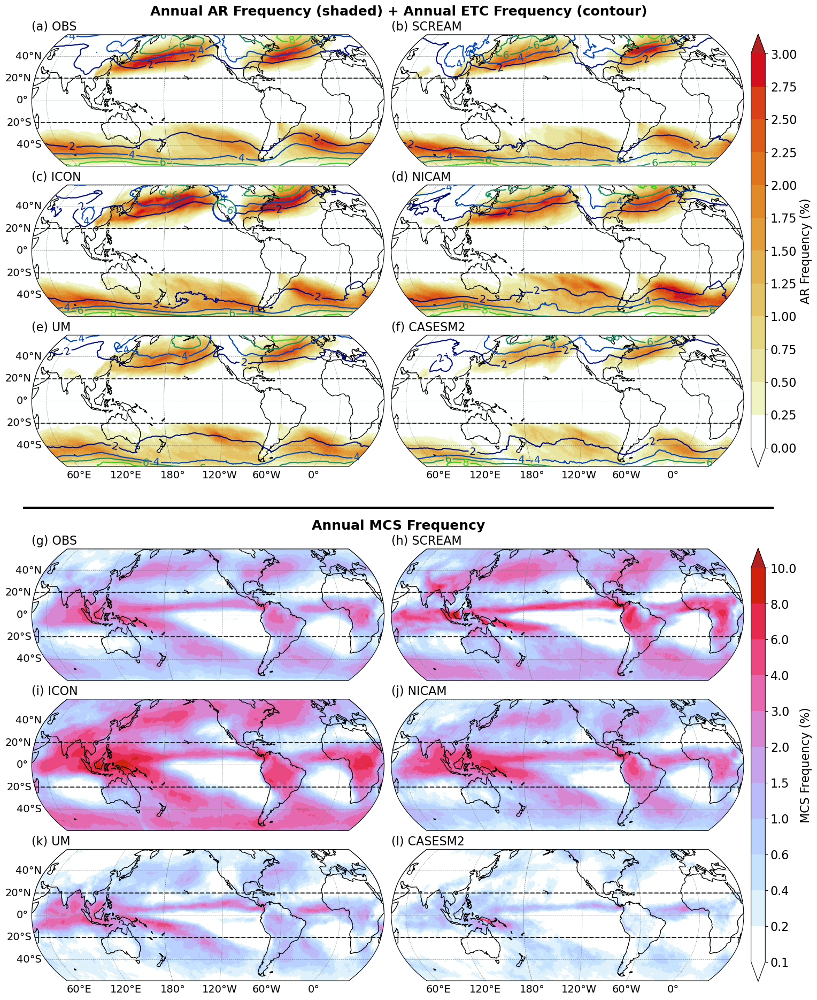

In [69]:
# -----------------------------------------------------------------------
# Combined figure: All AR Frequency (shaded) + All ETC Frequency (contour) (top) +
#                  All MCS Frequency (bottom)
# -----------------------------------------------------------------------

# Group 1: AR Frequency (shaded) + ETC Frequency (contour)
da_list_g0 = [
    [ar_freq_all.sel(source='obs'), ar_freq_all.sel(source='m1')],
    [ar_freq_all.sel(source='m2'), ar_freq_all.sel(source='m3')],
    [ar_freq_all.sel(source='m4'), ar_freq_all.sel(source='m5')],
]
titles_g0 = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"],
]
levels_g0 = np.arange(0,3.01,0.25)
cmap_g0 = cmaps.cet_l_wyor
cbticks_g0 = levels_g0
cblabel_g0 = 'AR Frequency (%)'
oob_g0 = {'over': 'firebrick', 'under': 'white'}

# Contour for group 1 (ETC Frequency)
da_list_contour_g0 = [
    [etc_freq_all.sel(source='obs'), etc_freq_all.sel(source='m1')],
    [etc_freq_all.sel(source='m2'), etc_freq_all.sel(source='m3')],
    [etc_freq_all.sel(source='m4'), etc_freq_all.sel(source='m5')],
]
da_list_contour = [da_list_contour_g0, None]
contour_levels    = [[np.arange(2, 10.1, 2)], None]   # [array] = shared
contour_colormaps = [[cmaps.cet_l_bgy], None]           # [cmap]  = shared
contour_kwargs    = [{'linewidths': 1.5}, None]         # shared kwargs for group 1

# Group 2: MCS Frequency (shaded)
da_list_g1 = [
    [mcs_freq_all.sel(source='obs'), mcs_freq_all.sel(source='m1')],
    [mcs_freq_all.sel(source='m2'), mcs_freq_all.sel(source='m3')],
    [mcs_freq_all.sel(source='m4'), mcs_freq_all.sel(source='m5')],
]
titles_g1 = [
    [f"(g) {name_map_plot['obs']}", f"(h) {name_map_plot['m1']}"],
    [f"(i) {name_map_plot['m2']}", f"(j) {name_map_plot['m3']}"],
    [f"(k) {name_map_plot['m4']}", f"(l) {name_map_plot['m5']}"],
]
levels_g1 = [0.1,0.2,0.4,0.6,1,1.5,2,3,4,6,8,10]
cmap_g1 = cmaps.cet_l_wcmr
cbticks_g1 = levels_g1
cblabel_g1 = 'MCS Frequency (%)'
oob_g1 = {'over': 'firebrick', 'under': 'white'}

# --- Shared plotting parameters ---
fontsize = 16
cb_fontsize = 16
wspace = 0.02
hspace = 0.13
lat_range = (-60, 60)
lat_lines = tropics_lat

lon_label_g = [[False, False],
               [False, False],
               [True,  True ]]
lat_label_g = [[True,  False],
               [True,  False],
               [True,  False]]

figname = f'{figdir}globalmap_mcs_ar_etc_freq_annual.pdf'

fig = plot_maps_two_groups(
    da_lists          = [da_list_g0, da_list_g1],
    titles_list       = [titles_g0,  titles_g1],
    group_levels      = [levels_g0,  levels_g1],
    group_colormaps   = [cmap_g0,    cmap_g1],
    group_cblabels    = [cblabel_g0, cblabel_g1],
    group_cbticks     = [cbticks_g0, cbticks_g1],
    group_titles      = ['Annual AR Frequency (shaded) + Annual ETC Frequency (contour)', 'Annual MCS Frequency'],
    figname           = figname,
    group_oob_colors  = [oob_g0, oob_g1],
    wspace=wspace, hspace=hspace,
    group_spacing     = 0.15,
    outer_hspace      = 0.1,
    figsize           = (14, 23),
    fontsize          = fontsize,
    cb_fontsize       = cb_fontsize,
    lat_range         = lat_range,
    lat_label         = [lat_label_g, lat_label_g],
    lon_label         = [lon_label_g, lon_label_g],
    show_gridlines    = True,
    lat_lines         = lat_lines,
    divider_color     = 'black',
    divider_lw        = 3,
    dpi               = 200,
    da_list_contour   = da_list_contour,
    contour_levels    = contour_levels,
    contour_colormaps = contour_colormaps,
    contour_kwargs    = contour_kwargs,
)
plt.show()


Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/globalmap_mcs_all_rain_and_rainfrac_annual.pdf


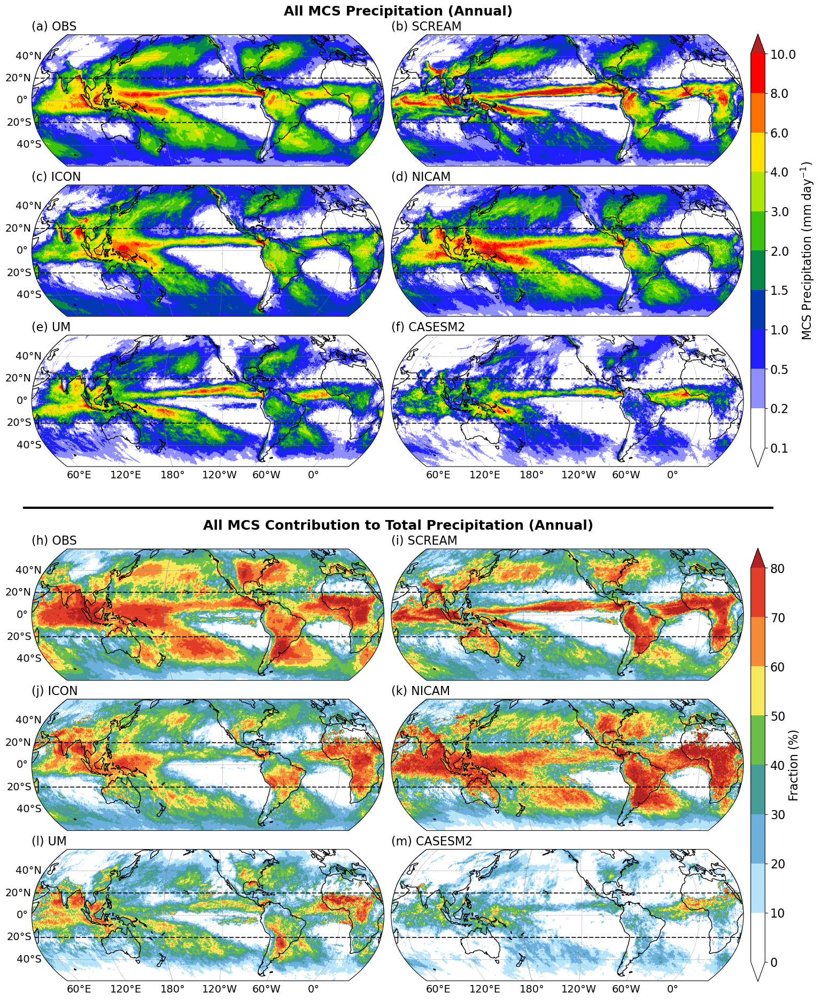

In [70]:
# -----------------------------------------------------------------------
# Combined figure: All MCS Precipitation (top) +
#                  All MCS Contribution to Total Precipitation (bottom)
# -----------------------------------------------------------------------

# --- Group 1: All MCS Precipitation (Annual) ---
da_list_g0 = [
    [mcs_pcp_all.sel(source='obs'), mcs_pcp_all.sel(source='m1')],
    [mcs_pcp_all.sel(source='m2'), mcs_pcp_all.sel(source='m3')],
    [mcs_pcp_all.sel(source='m4'), mcs_pcp_all.sel(source='m5')],
]
titles_g0 = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"],
]
levels_g0 = [0.1, 0.2, 0.5, 1, 1.5, 2, 3, 4, 6, 8, 10]
cmap_g0 = cmaps.WhBlGrYeRe
cbticks_g0 = levels_g0
cblabel_g0 = 'MCS Precipitation (mm day$^{-1}$)'
oob_g0 = {'over': 'firebrick', 'under': 'white'}

# --- Group 2: All MCS Contribution to Total Precipitation (Annual) ---
da_list_g1 = [
    [mcs_pcpfrac_all.sel(source='obs'), mcs_pcpfrac_all.sel(source='m1')],
    [mcs_pcpfrac_all.sel(source='m2'), mcs_pcpfrac_all.sel(source='m3')],
    [mcs_pcpfrac_all.sel(source='m4'), mcs_pcpfrac_all.sel(source='m5')],
]
titles_g1 = [
    [f"(h) {name_map_plot['obs']}", f"(i) {name_map_plot['m1']}"],
    [f"(j) {name_map_plot['m2']}", f"(k) {name_map_plot['m3']}"],
    [f"(l) {name_map_plot['m4']}", f"(m) {name_map_plot['m5']}"],
]
levels_g1 = np.arange(0, 81, 10)
cmap_g1 = truncate_colormap(cmaps.WhiteBlueGreenYellowRed, minval=0.0, maxval=0.8)
cbticks_g1 = levels_g1
cblabel_g1 = 'Fraction (%)'
oob_g1 = {'over': 'firebrick', 'under': 'white'}

# --- Shared plotting parameters ---
fontsize = 16
cb_fontsize = 16
wspace = 0.02
hspace = 0.13
lat_range = (-60, 60)
lat_lines = tropics_lat

lon_label_g = [[False, False],
               [False, False],
               [True,  True ]]
lat_label_g = [[True,  False],
               [True,  False],
               [True,  False]]

figname = f'{figdir}globalmap_mcs_all_rain_and_rainfrac_annual.pdf'

fig = plot_maps_two_groups(
    da_lists          = [da_list_g0, da_list_g1],
    titles_list       = [titles_g0,  titles_g1],
    group_levels      = [levels_g0,  levels_g1],
    group_colormaps   = [cmap_g0,    cmap_g1],
    group_cblabels    = [cblabel_g0, cblabel_g1],
    group_cbticks     = [cbticks_g0, cbticks_g1],
    group_titles      = ['All MCS Precipitation (Annual)',
                         'All MCS Contribution to Total Precipitation (Annual)'],
    figname           = figname,
    group_oob_colors  = [oob_g0, oob_g1],
    wspace=wspace, hspace=hspace,
    group_spacing     = 0.15,
    outer_hspace      = 0.1,
    figsize           = (14, 23),
    fontsize          = fontsize,
    cb_fontsize       = cb_fontsize,
    lat_range         = lat_range,
    lat_label         = [lat_label_g, lat_label_g],
    lon_label         = [lon_label_g, lon_label_g],
    show_gridlines    = True,
    lat_lines         = lat_lines,
    divider_color     = 'black',
    divider_lw        = 3,
    dpi               = 200,
)
plt.show()


Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/globalmap_mcs_iso_rain_and_rainfrac_annual.pdf


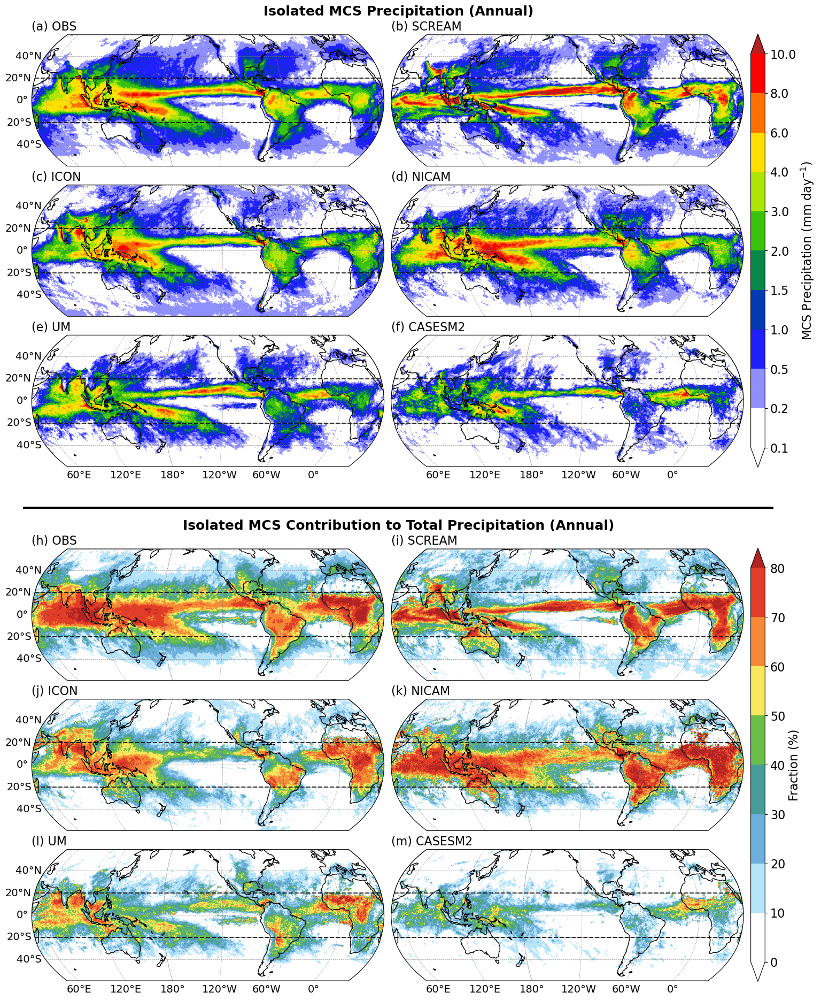

In [71]:
# -----------------------------------------------------------------------
# Combined figure: Isolated MCS Precipitation (top) +
#                  Isolated MCS Contribution to Total Precipitation (bottom)
# -----------------------------------------------------------------------

# --- Group 1: Isolated MCS Precipitation (Annual) ---
da_list_g0 = [
    [mcs_iso_pcp_all.sel(source='obs'), mcs_iso_pcp_all.sel(source='m1')],
    [mcs_iso_pcp_all.sel(source='m2'), mcs_iso_pcp_all.sel(source='m3')],
    [mcs_iso_pcp_all.sel(source='m4'), mcs_iso_pcp_all.sel(source='m5')],
]
titles_g0 = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"],
]
levels_g0 = [0.1, 0.2, 0.5, 1, 1.5, 2, 3, 4, 6, 8, 10]
cmap_g0 = cmaps.WhBlGrYeRe
cbticks_g0 = levels_g0
cblabel_g0 = 'MCS Precipitation (mm day$^{-1}$)'
oob_g0 = {'over': 'firebrick', 'under': 'white'}

# --- Group 2: Isolated MCS Contribution to Total Precipitation (Annual) ---
da_list_g1 = [
    [mcs_iso_pcpfrac_all.sel(source='obs'), mcs_iso_pcpfrac_all.sel(source='m1')],
    [mcs_iso_pcpfrac_all.sel(source='m2'), mcs_iso_pcpfrac_all.sel(source='m3')],
    [mcs_iso_pcpfrac_all.sel(source='m4'), mcs_iso_pcpfrac_all.sel(source='m5')],
]
titles_g1 = [
    [f"(h) {name_map_plot['obs']}", f"(i) {name_map_plot['m1']}"],
    [f"(j) {name_map_plot['m2']}", f"(k) {name_map_plot['m3']}"],
    [f"(l) {name_map_plot['m4']}", f"(m) {name_map_plot['m5']}"],
]
levels_g1 = np.arange(0, 81, 10)
cmap_g1 = truncate_colormap(cmaps.WhiteBlueGreenYellowRed, minval=0.0, maxval=0.8)
cbticks_g1 = levels_g1
cblabel_g1 = 'Fraction (%)'
oob_g1 = {'over': 'firebrick', 'under': 'white'}

figname = f'{figdir}globalmap_mcs_iso_rain_and_rainfrac_annual.pdf'

fig = plot_maps_two_groups(
    da_lists          = [da_list_g0, da_list_g1],
    titles_list       = [titles_g0,  titles_g1],
    group_levels      = [levels_g0,  levels_g1],
    group_colormaps   = [cmap_g0,    cmap_g1],
    group_cblabels    = [cblabel_g0, cblabel_g1],
    group_cbticks     = [cbticks_g0, cbticks_g1],
    group_titles      = ['Isolated MCS Precipitation (Annual)',
                         'Isolated MCS Contribution to Total Precipitation (Annual)'],
    figname           = figname,
    group_oob_colors  = [oob_g0, oob_g1],
    wspace=wspace, hspace=hspace,
    group_spacing     = 0.15,
    outer_hspace      = 0.1,
    figsize           = (14, 23),
    fontsize          = fontsize,
    cb_fontsize       = cb_fontsize,
    lat_range         = lat_range,
    lat_label         = [lat_label_g, lat_label_g],
    lon_label         = [lon_label_g, lon_label_g],
    show_gridlines    = True,
    lat_lines         = lat_lines,
    divider_color     = 'black',
    divider_lw        = 3,
    dpi               = 200,
)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/globalmap_mcs_ar_etc_rain_and_rainfrac_annual.pdf


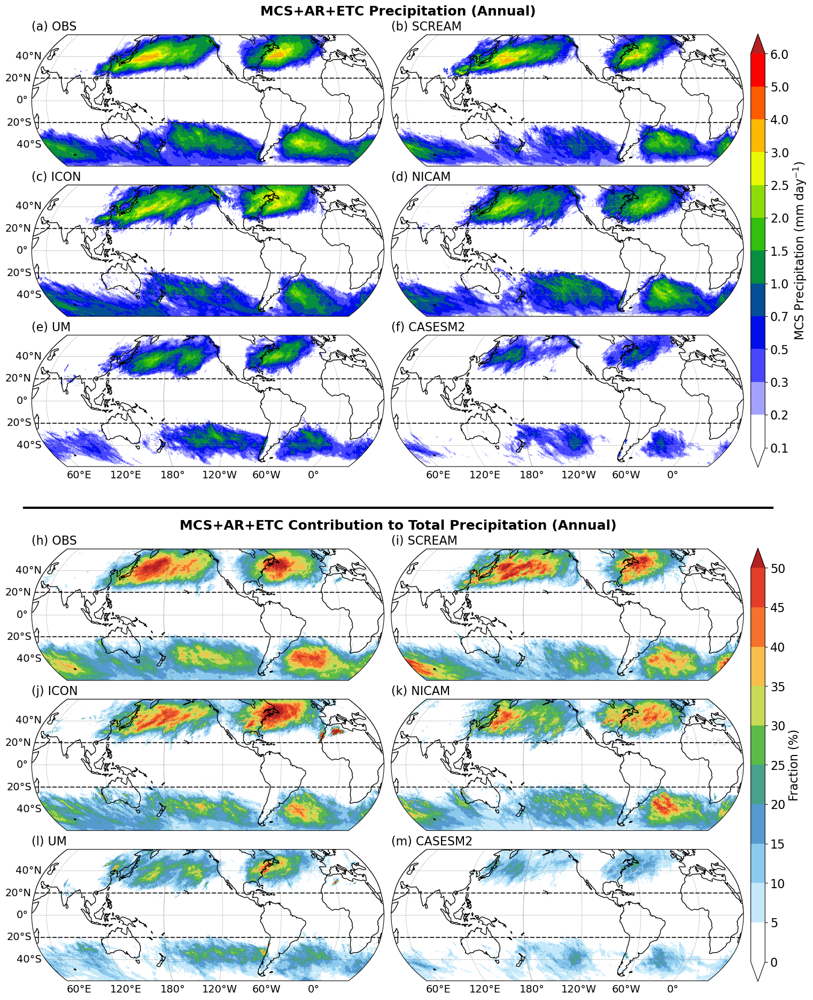

In [72]:
# -----------------------------------------------------------------------
# Combined figure: MCS+AR+ETC Precipitation (top) +
#                  MCS+AR+ETC Contribution to Total Precipitation (bottom)
# -----------------------------------------------------------------------

# --- Group 1: MCS+AR+ETC Precipitation (Annual) ---
da_list_g0 = [
    [mcs_ar_etc_pcp_all.sel(source='obs'), mcs_ar_etc_pcp_all.sel(source='m1')],
    [mcs_ar_etc_pcp_all.sel(source='m2'), mcs_ar_etc_pcp_all.sel(source='m3')],
    [mcs_ar_etc_pcp_all.sel(source='m4'), mcs_ar_etc_pcp_all.sel(source='m5')],
]
titles_g0 = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"],
]
# levels_g0 = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
levels_g0 = [0.1,0.2,0.3,0.5,0.7,1,1.5,2,2.5,3,4,5,6]
cmap_g0 = cmaps.WhBlGrYeRe
cbticks_g0 = levels_g0
cblabel_g0 = 'MCS Precipitation (mm day$^{-1}$)'
oob_g0 = {'over': 'firebrick', 'under': 'white'}

# --- Group 2: MCS+AR+ETC Contribution to Total Precipitation (Annual) ---
da_list_g1 = [
    [mcs_ar_etc_pcpfrac_all.sel(source='obs'), mcs_ar_etc_pcpfrac_all.sel(source='m1')],
    [mcs_ar_etc_pcpfrac_all.sel(source='m2'), mcs_ar_etc_pcpfrac_all.sel(source='m3')],
    [mcs_ar_etc_pcpfrac_all.sel(source='m4'), mcs_ar_etc_pcpfrac_all.sel(source='m5')],
]
titles_g1 = [
    [f"(h) {name_map_plot['obs']}", f"(i) {name_map_plot['m1']}"],
    [f"(j) {name_map_plot['m2']}", f"(k) {name_map_plot['m3']}"],
    [f"(l) {name_map_plot['m4']}", f"(m) {name_map_plot['m5']}"],
]
levels_g1 = np.arange(0, 51, 5)
cmap_g1 = truncate_colormap(cmaps.WhiteBlueGreenYellowRed, minval=0.0, maxval=0.8)
cbticks_g1 = levels_g1
cblabel_g1 = 'Fraction (%)'
oob_g1 = {'over': 'firebrick', 'under': 'white'}

figname = f'{figdir}globalmap_mcs_ar_etc_rain_and_rainfrac_annual.pdf'

fig = plot_maps_two_groups(
    da_lists          = [da_list_g0, da_list_g1],
    titles_list       = [titles_g0,  titles_g1],
    group_levels      = [levels_g0,  levels_g1],
    group_colormaps   = [cmap_g0,    cmap_g1],
    group_cblabels    = [cblabel_g0, cblabel_g1],
    group_cbticks     = [cbticks_g0, cbticks_g1],
    group_titles      = ['MCS+AR+ETC Precipitation (Annual)',
                         'MCS+AR+ETC Contribution to Total Precipitation (Annual)'],
    figname           = figname,
    group_oob_colors  = [oob_g0, oob_g1],
    wspace=wspace, hspace=hspace,
    group_spacing     = 0.15,
    outer_hspace      = 0.1,
    figsize           = (14, 23),
    fontsize          = fontsize,
    cb_fontsize       = cb_fontsize,
    lat_range         = lat_range,
    lat_label         = [lat_label_g, lat_label_g],
    lon_label         = [lon_label_g, lon_label_g],
    show_gridlines    = True,
    lat_lines         = lat_lines,
    divider_color     = 'black',
    divider_lw        = 3,
    dpi               = 200,
)

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/globalmap_mcs_ar_rain_and_rainfrac_annual.pdf


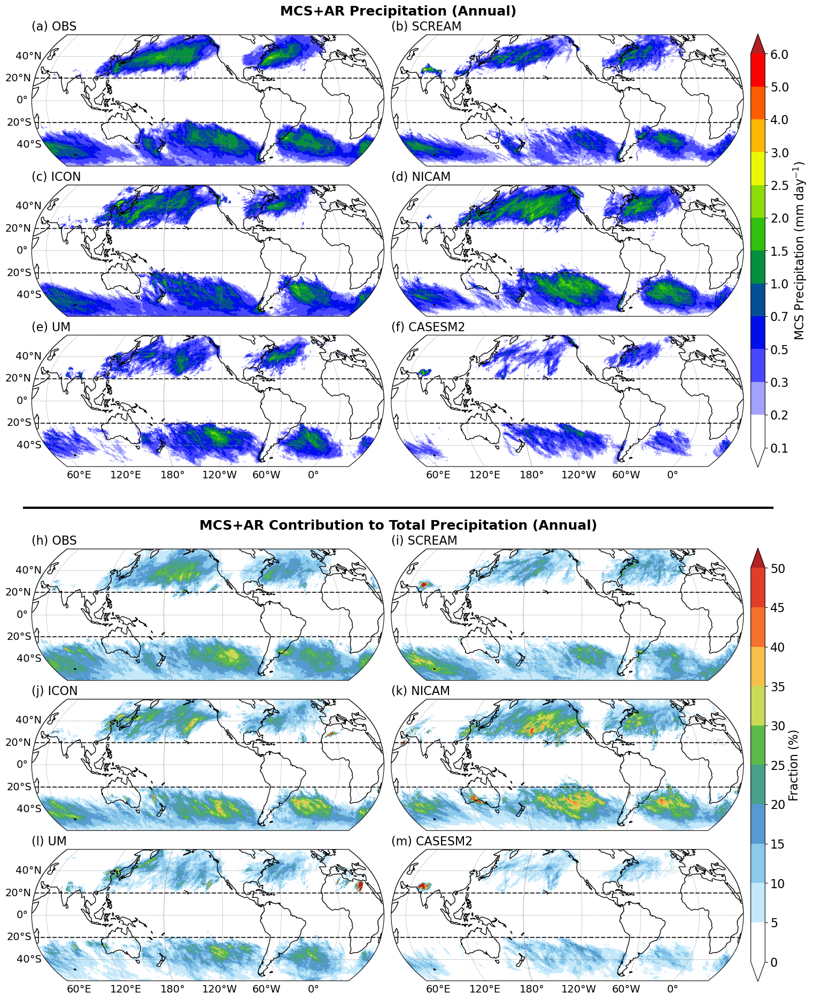

In [73]:
# -----------------------------------------------------------------------
# Combined figure: MCS+AR Precipitation (top) +
#                  MCS+AR Contribution to Total Precipitation (bottom)
# -----------------------------------------------------------------------

# --- Group 1: MCS+AR Precipitation (Annual) ---
da_list_g0 = [
    [mcs_ar_pcp_all.sel(source='obs'), mcs_ar_pcp_all.sel(source='m1')],
    [mcs_ar_pcp_all.sel(source='m2'), mcs_ar_pcp_all.sel(source='m3')],
    [mcs_ar_pcp_all.sel(source='m4'), mcs_ar_pcp_all.sel(source='m5')],
]
titles_g0 = [
    [f"(a) {name_map_plot['obs']}", f"(b) {name_map_plot['m1']}"],
    [f"(c) {name_map_plot['m2']}", f"(d) {name_map_plot['m3']}"],
    [f"(e) {name_map_plot['m4']}", f"(f) {name_map_plot['m5']}"],
]
levels_g0 = [0.1,0.2,0.3,0.5,0.7,1,1.5,2,2.5,3,4,5,6]
cmap_g0 = cmaps.WhBlGrYeRe
cbticks_g0 = levels_g0
cblabel_g0 = 'MCS Precipitation (mm day$^{-1}$)'
oob_g0 = {'over': 'firebrick', 'under': 'white'}

# --- Group 2: MCS+AR Contribution to Total Precipitation (Annual) ---
da_list_g1 = [
    [mcs_ar_pcpfrac_all.sel(source='obs'), mcs_ar_pcpfrac_all.sel(source='m1')],
    [mcs_ar_pcpfrac_all.sel(source='m2'), mcs_ar_pcpfrac_all.sel(source='m3')],
    [mcs_ar_pcpfrac_all.sel(source='m4'), mcs_ar_pcpfrac_all.sel(source='m5')],
]
titles_g1 = [
    [f"(h) {name_map_plot['obs']}", f"(i) {name_map_plot['m1']}"],
    [f"(j) {name_map_plot['m2']}", f"(k) {name_map_plot['m3']}"],
    [f"(l) {name_map_plot['m4']}", f"(m) {name_map_plot['m5']}"],
]
levels_g1 = np.arange(0, 51, 5)
cmap_g1 = truncate_colormap(cmaps.WhiteBlueGreenYellowRed, minval=0.0, maxval=0.8)
cbticks_g1 = levels_g1
cblabel_g1 = 'Fraction (%)'
oob_g1 = {'over': 'firebrick', 'under': 'white'}

figname = f'{figdir}globalmap_mcs_ar_rain_and_rainfrac_annual.pdf'

fig = plot_maps_two_groups(
    da_lists          = [da_list_g0, da_list_g1],
    titles_list       = [titles_g0,  titles_g1],
    group_levels      = [levels_g0,  levels_g1],
    group_colormaps   = [cmap_g0,    cmap_g1],
    group_cblabels    = [cblabel_g0, cblabel_g1],
    group_cbticks     = [cbticks_g0, cbticks_g1],
    group_titles      = ['MCS+AR Precipitation (Annual)',
                         'MCS+AR Contribution to Total Precipitation (Annual)'],
    figname           = figname,
    group_oob_colors  = [oob_g0, oob_g1],
    wspace=wspace, hspace=hspace,
    group_spacing     = 0.15,
    outer_hspace      = 0.1,
    figsize           = (14, 23),
    fontsize          = fontsize,
    cb_fontsize       = cb_fontsize,
    lat_range         = lat_range,
    lat_label         = [lat_label_g, lat_label_g],
    lon_label         = [lon_label_g, lon_label_g],
    show_gridlines    = True,
    lat_lines         = lat_lines,
    divider_color     = 'black',
    divider_lw        = 3,
    dpi               = 200,
)

## Function to plot difference maps

In [74]:
def plot_maps_obs_and_diffs_grid(obs_data, model_data_list, titles, 
                                 obs_levels, diff_levels, obs_colormap, diff_colormap, 
                                 obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, 
                                 figname, gridlayout,
                                 obs_oob_colors=None, diff_oob_colors=None,
                                 min_thresh=None, wspace=None, hspace=None, 
                                 figsize=None, fontsize=None, cb_fontsize=None, 
                                 figtitle=None, dpi=200, lat_lines=None, show_gridlines=False):
    """
    Plot OBS data in first panel and model differences (model - obs) in remaining panels,
    arranged in a custom grid layout. Skips panels where data is None.
    Two vertical colorbars are placed on the left (OBS) and right (diff) sides of the plot grid.
    
    Parameters:
    -----------
    obs_data : xarray.DataArray
        Observational data for the first panel
    model_data_list : list
        List of model xarray.DataArrays for difference calculation. Can contain None to skip panels.
    titles : list
        List of titles for each panel (obs + models). Can contain None to skip panels.
    obs_levels : list
        Color levels for observational data
    diff_levels : list
        Color levels for difference data
    obs_colormap : str or colormap
        Colormap for observational data
    diff_colormap : str or colormap
        Colormap for difference data
    obs_cblabel : str
        Label for observational colorbar
    diff_cblabel : str
        Label for difference colorbar
    obs_cbticks : list
        Tick values for observational colorbar
    diff_cbticks : list
        Tick values for difference colorbar
    figname : str
        Output filename
    gridlayout : list
        [nrow, ncol] specifying the grid dimensions
    obs_oob_colors : dict or None
        Out-of-bounds colors for observational data {'over': color, 'under': color}
    diff_oob_colors : dict or None
        Out-of-bounds colors for difference data {'over': color, 'under': color}
    min_thresh : float or None
        Minimum threshold for data display
    wspace : float or None
        Width space between subplots
    hspace : float or None
        Height space between subplots
    figsize : tuple or None
        Figure size (width, height) in inches
    fontsize : float or None
        Font size for text elements
    cb_fontsize : float or None
        Font size for colorbar text elements
    figtitle : str or None
        Title for the entire figure
    dpi : int
        Resolution for saved figure
    lat_lines : list or None
        List of latitude values to plot as horizontal lines
    show_gridlines : bool
        Whether to show gridlines on the maps
    
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The created figure object
    """
    
    # Get grid dimensions from input
    nrow, ncol = gridlayout
    
    # Calculate difference data
    diff_data_list = []
    for model_data in model_data_list:
        if model_data is not None:
            diff_data = model_data - obs_data
            diff_data_list.append(diff_data)
        else:
            diff_data_list.append(None)
    
    # Set up matplotlib parameters
    mpl.rcParams['font.size'] = fontsize
    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    
    # Create figure with custom grid layout
    fig = plt.figure(figsize=figsize, dpi=100)
    
    # Main grid: [obs_cbar | maps | diff_cbar]
    # Increased width for left colorbar to accommodate left-side labels
    gs_main = gridspec.GridSpec(1, 3, figure=fig, width_ratios=[0.02, 1, 0.02], wspace=0.05)
    gs_main.update(top=0.93, bottom=0.05)  # Adjust vertical position
    
    # Subplot grid for maps (middle column)
    gs_maps = gridspec.GridSpecFromSubplotSpec(nrow, ncol, subplot_spec=gs_main[1], 
                                               wspace=wspace, hspace=hspace)
    
    # Set up colormaps
    obs_cmap = copy.copy(mpl.colormaps.get_cmap(obs_colormap))
    diff_cmap = copy.copy(mpl.colormaps.get_cmap(diff_colormap))

    # Set out-of-bounds colors
    if obs_oob_colors is not None:
        oob_c = obs_oob_colors
        if oob_c is not None:
            obs_cmap.set_over(oob_c['over'])
            obs_cmap.set_under(oob_c['under'])
    if diff_oob_colors is not None:
        oob_c = diff_oob_colors
        if oob_c is not None:
            diff_cmap.set_over(oob_c['over'])
            diff_cmap.set_under(oob_c['under'])

    # Color normalizations
    obs_norm = colors.BoundaryNorm(boundaries=obs_levels, ncolors=obs_cmap.N)
    diff_norm = colors.BoundaryNorm(boundaries=diff_levels, ncolors=diff_cmap.N)
    
    # Variables to store plot objects for colorbars
    obs_plot = None
    diff_plot = None
    
    # Plot data panels
    panel_idx = 0
    
    # First panel: Observational data
    row = panel_idx // ncol
    col = panel_idx % ncol
    ax = plt.subplot(gs_maps[row, col], projection=proj)
    ax.set_global()
    ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
    ax.set_aspect('auto', adjustable=None)
    
    # Add title
    ax.set_title(titles[0], fontsize=fontsize, loc='center')
    
    # Add gridlines
    # gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
    
    # Apply minimum threshold if provided
    plot_data = obs_data
    if min_thresh is not None:
        plot_data = plot_data.where(plot_data > min_thresh)
    
    # Plot observational data
    obs_plot = egh.healpix_show(plot_data, ax=ax, cmap=obs_cmap, norm=obs_norm, zorder=2)

    # Add gridlines
    if show_gridlines:
        gl = ax.gridlines(crs=data_proj, draw_labels=False, linestyle='--', linewidth=0.5, zorder=10)
    
    # Add latitude lines if specified
    if lat_lines is not None:
        for lat in lat_lines:
            lons = np.linspace(-180, 180, 361)
            lats = np.full_like(lons, lat)
            ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                   transform=data_proj, zorder=4, alpha=0.8)
    
    panel_idx += 1
    
    # Remaining panels: Model differences
    for i, (diff_data, title) in enumerate(zip(diff_data_list, titles[1:])):
        # Skip if data or title is None
        if diff_data is None or title is None:
            panel_idx += 1
            continue
            
        row = panel_idx // ncol
        col = panel_idx % ncol
        ax = plt.subplot(gs_maps[row, col], projection=proj)
        ax.set_global()
        ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
        ax.set_aspect('auto', adjustable=None)
        
        # Add title
        ax.set_title(title, fontsize=fontsize, loc='center')
        
        # Plot difference data
        diff_plot = egh.healpix_show(diff_data, ax=ax, cmap=diff_cmap, norm=diff_norm, zorder=2)

        # Add gridlines
        if show_gridlines:
            gl = ax.gridlines(crs=data_proj, draw_labels=False, linestyle='--', linewidth=0.5, zorder=10)
        
        # Add latitude lines if specified
        if lat_lines is not None:
            for lat in lat_lines:
                lons = np.linspace(-180, 180, 361)
                lats = np.full_like(lons, lat)
                ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                       transform=data_proj, zorder=4, alpha=0.8)
        
        panel_idx += 1
    
    # Hide empty subplots
    for idx in range(panel_idx, nrow * ncol):
        row = idx // ncol
        col = idx % ncol
        ax = plt.subplot(gs_maps[row, col])
        ax.set_visible(False)
    
    # Add vertical colorbars
    # Left colorbar for OBS data with ticks on the left
    if obs_plot is not None:
        cax_obs = plt.subplot(gs_main[0])
        cbar_obs = plt.colorbar(obs_plot, cax=cax_obs, label=obs_cblabel, 
                               ticks=obs_cbticks, orientation='vertical', extend='both')
        cbar_obs.ax.yaxis.set_ticks_position('left')  # Ticks on the left
        cbar_obs.ax.yaxis.set_label_position('left')  # Label on the left
        cbar_obs.ax.tick_params(labelsize=cb_fontsize)
    
    # Right colorbar for difference data
    if diff_plot is not None:
        cax_diff = plt.subplot(gs_main[2])
        cbar_diff = plt.colorbar(diff_plot, cax=cax_diff, label=diff_cblabel, 
                                ticks=diff_cbticks, orientation='vertical', extend='both')
        cbar_diff.ax.tick_params(labelsize=cb_fontsize)
    
    # Add suptitle
    if figtitle:
        fig.suptitle(figtitle, y=0.98, fontweight='bold', fontsize=fontsize+2)
    
    # Save figure
    fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
    return fig

### Precipitation Amount

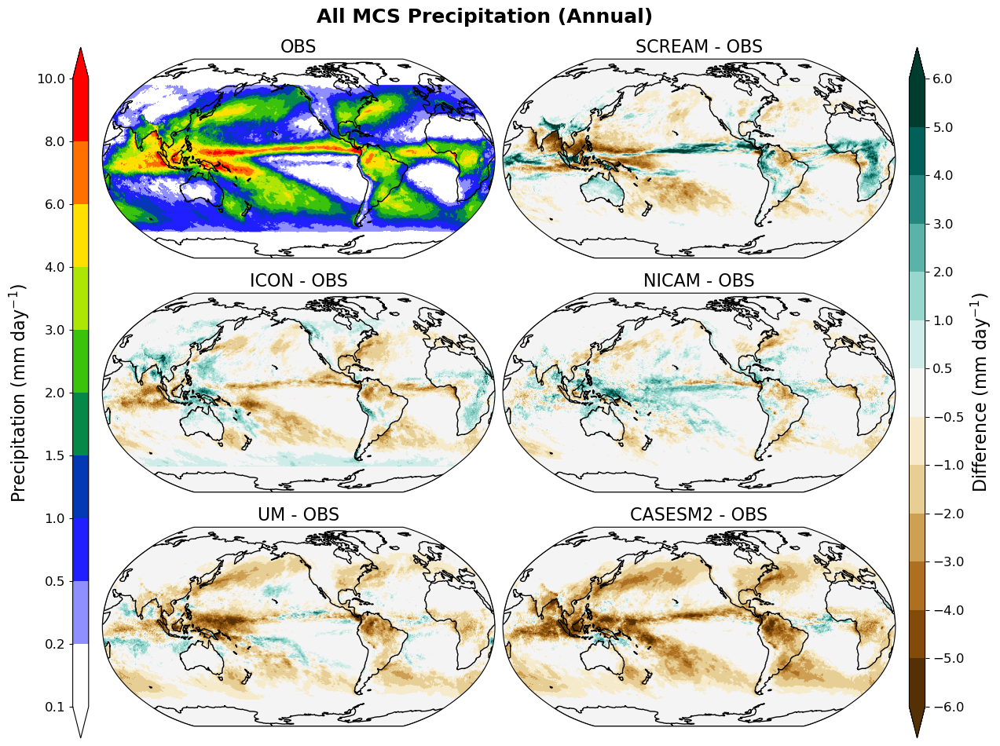

In [75]:
gridlayout=[3, 2]   # 2 rows, 3 columns

obs_data = mcs_pcp_all.sel(source='obs')
model_data_list = [
    mcs_pcp_all.sel(source='m1'),
    mcs_pcp_all.sel(source='m2'),
    mcs_pcp_all.sel(source='m3'),
    mcs_pcp_all.sel(source='m4'),
    mcs_pcp_all.sel(source='m5'),
]
titles = [f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}",
    f"{name_map_plot['m4']} - {name_map_plot['obs']}",
    f"{name_map_plot['m5']} - {name_map_plot['obs']}",
]

# Setup parameters
figwidth = 14
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-6,-5,-4,-3,-2,-1,-0.5,0.5,1,2,3,4,5,6]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_mcs_all_rain_obs_vs_models_diff.png'
figtitle = 'All MCS Precipitation (Annual)'

fig = plot_maps_obs_and_diffs_grid(
    obs_data=obs_data,
    model_data_list=model_data_list,
    titles=titles,
    gridlayout=gridlayout, 
    obs_levels=obs_levels,
    diff_levels=diff_levels,
    obs_colormap=obs_colormap,
    diff_colormap=diff_colormap,
    obs_cblabel=obs_cblabel,
    diff_cblabel=diff_cblabel,
    obs_cbticks=obs_cbticks,
    diff_cbticks=diff_cbticks,
    figname=figname,
    figsize=figsize,
    fontsize=fontsize,
    cb_fontsize=cb_fontsize,
    wspace=wspace, hspace=hspace,
    figtitle=figtitle,
)

In [76]:
# gridlayout=[3, 2]   # 2 rows, 3 columns

# obs_data = mcs_iso_pcp_all.sel(source='obs')
# model_data_list = [
#     mcs_iso_pcp_all.sel(source='m1'),
#     mcs_iso_pcp_all.sel(source='m2'),
#     mcs_iso_pcp_all.sel(source='m3'),
#     mcs_iso_pcp_all.sel(source='m4'),
#     mcs_iso_pcp_all.sel(source='m5'),
# ]
# titles = [f"{name_map_plot['obs']}",
#     f"{name_map_plot['m1']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m2']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m3']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m4']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m5']} - {name_map_plot['obs']}",
# ]
# lat_lines = tropics_lat

# # Observational data parameters
# obs_levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
# obs_colormap = cmaps.WhBlGrYeRe
# obs_cbticks = obs_levels
# obs_oob_colors = {'over':'firebrick', 'under':'white'}
# obs_cblabel = 'MCS Precipitation (mm day$^{-1}$)'

# # Difference data parameters
# diff_levels = [-6,-5,-4,-3,-2,-1,-0.5,0.5,1,2,3,4,5,6]
# diff_colormap = 'BrBG'
# diff_oob_colors = None
# diff_cbticks = diff_levels
# diff_cblabel = 'Difference (mm day$^{-1}$)'

# figname = f'{figdir}globalmap_mcs_iso_rain_obs_vs_models_diff.png'
# figtitle = 'Isolated MCS Precipitation (Annual)'

# fig = plot_maps_obs_and_diffs_grid(
#     obs_data=obs_data,
#     model_data_list=model_data_list,
#     titles=titles,
#     gridlayout=gridlayout, 
#     obs_levels=obs_levels,
#     diff_levels=diff_levels,
#     obs_colormap=obs_colormap,
#     diff_colormap=diff_colormap,
#     obs_cblabel=obs_cblabel,
#     diff_cblabel=diff_cblabel,
#     obs_cbticks=obs_cbticks,
#     diff_cbticks=diff_cbticks,
#     figname=figname,
#     figsize=figsize,
#     fontsize=fontsize,
#     cb_fontsize=cb_fontsize,
#     wspace=wspace, hspace=hspace,
#     figtitle=figtitle,
#     lat_lines=lat_lines,
# )

In [77]:
# gridlayout=[3, 2]   # 2 rows, 3 columns

# obs_data = mcs_ar_etc_pcp_all.sel(source='obs')
# model_data_list = [
#     mcs_ar_etc_pcp_all.sel(source='m1'),
#     mcs_ar_etc_pcp_all.sel(source='m2'),
#     mcs_ar_etc_pcp_all.sel(source='m3'),
#     mcs_ar_etc_pcp_all.sel(source='m4'),
#     mcs_ar_etc_pcp_all.sel(source='m5'),
# ]
# titles = [f"{name_map_plot['obs']}",
#     f"{name_map_plot['m1']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m2']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m3']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m4']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m5']} - {name_map_plot['obs']}",
# ]
# lat_lines = tropics_lat

# # Observational data parameters
# obs_levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
# obs_colormap = cmaps.WhBlGrYeRe
# obs_cbticks = obs_levels
# obs_oob_colors = {'over':'firebrick', 'under':'white'}
# obs_cblabel = 'Precipitation (mm day$^{-1}$)'

# # Difference data parameters
# diff_levels = [-3,-2,-1.5,-1,-0.5,-0.2,0.2,0.5,1,1.5,2,3]
# diff_colormap = 'BrBG'
# diff_oob_colors = None
# diff_cbticks = diff_levels
# diff_cblabel = 'Difference (mm day$^{-1}$)'

# figname = f'{figdir}globalmap_mcs_ar_etc_rain_obs_vs_models_diff.png'
# figtitle = 'MCS-AR-ETC Precipitation (Annual)'

# fig = plot_maps_obs_and_diffs_grid(
#     obs_data=obs_data,
#     model_data_list=model_data_list,
#     titles=titles,
#     gridlayout=gridlayout, 
#     obs_levels=obs_levels,
#     diff_levels=diff_levels,
#     obs_colormap=obs_colormap,
#     diff_colormap=diff_colormap,
#     obs_cblabel=obs_cblabel,
#     diff_cblabel=diff_cblabel,
#     obs_cbticks=obs_cbticks,
#     diff_cbticks=diff_cbticks,
#     figname=figname,
#     figsize=figsize,
#     fontsize=fontsize,
#     cb_fontsize=cb_fontsize,
#     wspace=wspace, hspace=hspace,
#     figtitle=figtitle,
#     lat_lines=lat_lines,
# )

In [78]:
# gridlayout=[3, 2]   # 2 rows, 3 columns

# obs_data = mcs_ar_pcp_all.sel(source='obs')
# model_data_list = [
#     mcs_ar_pcp_all.sel(source='m1'),
#     mcs_ar_pcp_all.sel(source='m2'),
#     mcs_ar_pcp_all.sel(source='m3'),
#     mcs_ar_pcp_all.sel(source='m4'),
#     mcs_ar_pcp_all.sel(source='m5'),
# ]
# titles = [f"{name_map_plot['obs']}",
#     f"{name_map_plot['m1']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m2']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m3']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m4']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m5']} - {name_map_plot['obs']}",
# ]
# lat_lines = tropics_lat

# # Observational data parameters
# obs_levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
# obs_colormap = cmaps.WhBlGrYeRe
# obs_cbticks = obs_levels
# obs_oob_colors = {'over':'firebrick', 'under':'white'}
# obs_cblabel = 'Precipitation (mm day$^{-1}$)'

# # Difference data parameters
# diff_levels = [-3,-2,-1.5,-1,-0.5,-0.2,0.2,0.5,1,1.5,2,3]
# diff_colormap = 'BrBG'
# diff_oob_colors = None
# diff_cbticks = diff_levels
# diff_cblabel = 'Difference (mm day$^{-1}$)'

# figname = f'{figdir}globalmap_mcs_ar_rain_obs_vs_models_diff.png'
# figtitle = 'MCS-AR Precipitation (Annual)'

# fig = plot_maps_obs_and_diffs_grid(
#     obs_data=obs_data,
#     model_data_list=model_data_list,
#     titles=titles,
#     gridlayout=gridlayout, 
#     obs_levels=obs_levels,
#     diff_levels=diff_levels,
#     obs_colormap=obs_colormap,
#     diff_colormap=diff_colormap,
#     obs_cblabel=obs_cblabel,
#     diff_cblabel=diff_cblabel,
#     obs_cbticks=obs_cbticks,
#     diff_cbticks=diff_cbticks,
#     figname=figname,
#     figsize=figsize,
#     fontsize=fontsize,
#     cb_fontsize=cb_fontsize,
#     wspace=wspace, hspace=hspace,
#     figtitle=figtitle,
#     lat_lines=lat_lines,
# )

### Contribution to Total Precipitation

In [79]:
# gridlayout=[3, 2]   # 2 rows, 3 columns

# obs_data = mcs_ar_etc_pcpfrac_all.sel(source='obs')
# model_data_list = [
#     mcs_ar_etc_pcpfrac_all.sel(source='m1'),
#     mcs_ar_etc_pcpfrac_all.sel(source='m2'),
#     mcs_ar_etc_pcpfrac_all.sel(source='m3'),
#     mcs_ar_etc_pcpfrac_all.sel(source='m4'),
#     mcs_ar_etc_pcpfrac_all.sel(source='m5'),
# ]
# titles = [f"{name_map_plot['obs']}",
#     f"{name_map_plot['m1']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m2']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m3']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m4']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m5']} - {name_map_plot['obs']}",
# ]
# lat_lines = tropics_lat

# # Observational data parameters
# obs_levels = np.arange(0, 71, 10)
# obs_colormap = cmaps.WhiteBlueGreenYellowRed
# obs_colormap = truncate_colormap(obs_colormap, minval=0.0, maxval=0.8)
# obs_cbticks = obs_levels
# obs_oob_colors = {'over':'firebrick', 'under':'white'}
# obs_cblabel = 'Fraction (%)'

# # Difference data parameters
# diff_levels = [-60,-40,-30,-20,-10,-5,5,10,20,30,40,60]
# diff_colormap = 'BrBG'
# diff_oob_colors = None
# diff_cbticks = diff_levels
# diff_cblabel = 'Difference (%)'

# figname = f'{figdir}globalmap_mcs_ar_etc_rainfrac_obs_vs_models_diff.png'
# figtitle = 'MCS-AR-ETC Contribution to Total Precipitation (Annual)'

# fig = plot_maps_obs_and_diffs_grid(
#     obs_data=obs_data,
#     model_data_list=model_data_list,
#     titles=titles,
#     gridlayout=gridlayout, 
#     obs_levels=obs_levels,
#     diff_levels=diff_levels,
#     obs_colormap=obs_colormap,
#     diff_colormap=diff_colormap,
#     obs_cblabel=obs_cblabel,
#     diff_cblabel=diff_cblabel,
#     obs_cbticks=obs_cbticks,
#     diff_cbticks=diff_cbticks,
#     figname=figname,
#     figsize=figsize,
#     fontsize=fontsize,
#     cb_fontsize=cb_fontsize,
#     wspace=wspace, hspace=hspace,
#     figtitle=figtitle,
#     lat_lines=lat_lines,
# )

In [80]:
# gridlayout=[3, 2]   # 2 rows, 3 columns

# obs_data = mcs_ar_pcpfrac_all.sel(source='obs')
# model_data_list = [
#     mcs_ar_pcpfrac_all.sel(source='m1'),
#     mcs_ar_pcpfrac_all.sel(source='m2'),
#     mcs_ar_pcpfrac_all.sel(source='m3'),
#     mcs_ar_pcpfrac_all.sel(source='m4'),
#     mcs_ar_pcpfrac_all.sel(source='m5'),
# ]
# titles = [f"{name_map_plot['obs']}",
#     f"{name_map_plot['m1']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m2']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m3']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m4']} - {name_map_plot['obs']}",
#     f"{name_map_plot['m5']} - {name_map_plot['obs']}",
# ]
# lat_lines = tropics_lat

# # Observational data parameters
# obs_levels = np.arange(0, 71, 10)
# obs_colormap = cmaps.WhiteBlueGreenYellowRed
# obs_colormap = truncate_colormap(obs_colormap, minval=0.0, maxval=0.8)
# obs_cbticks = obs_levels
# obs_oob_colors = {'over':'firebrick', 'under':'white'}
# obs_cblabel = 'Fraction (%)'

# # Difference data parameters
# diff_levels =  [-60,-40,-30,-20,-10,-5,5,10,20,30,40,60]
# diff_colormap = 'BrBG'
# diff_oob_colors = None
# diff_cbticks = diff_levels
# diff_cblabel = 'Difference (%)'

# figname = f'{figdir}globalmap_mcs_ar_rainfrac_obs_vs_models_diff.png'
# figtitle = 'MCS-AR Contribution to Total Precipitation (Annual)'

# fig = plot_maps_obs_and_diffs_grid(
#     obs_data=obs_data,
#     model_data_list=model_data_list,
#     titles=titles,
#     gridlayout=gridlayout, 
#     obs_levels=obs_levels,
#     diff_levels=diff_levels,
#     obs_colormap=obs_colormap,
#     diff_colormap=diff_colormap,
#     obs_cblabel=obs_cblabel,
#     diff_cblabel=diff_cblabel,
#     obs_cbticks=obs_cbticks,
#     diff_cbticks=diff_cbticks,
#     figname=figname,
#     figsize=figsize,
#     fontsize=fontsize,
#     cb_fontsize=cb_fontsize,
#     wspace=wspace, hspace=hspace,
#     figtitle=figtitle,
#     lat_lines=lat_lines,
# )